In [1]:
%load_ext autoreload
%autoreload 2
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

import sys, gc, torch
from functools import reduce
import numpy as np, pandas as pd, itertools
from tqdm import tqdm
import seaborn as sns; sns.set()
import matplotlib
import matplotlib.pyplot as plt

code_path = r"/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main"

sys.path.append(code_path)
sys.path.append(code_path+"/src")
data_path = code_path+"/data"
result_path = code_path+"/results"
import utilities as util

%matplotlib inline

# Model Data sets

In [2]:
!nvidia-smi

Sat Oct 12 15:05:22 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.60.13    Driver Version: 525.60.13    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100 80G...  Off  | 00000000:65:00.0 Off |                    0 |
| N/A   40C    P0    65W / 300W |      0MiB / 81920MiB |     24%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
# https://pytorch.org/tutorials/beginner/basics/data_tutorial.html
# More discussion and examples on PyTorch datasets and dataloaders in:
# https://pytorch.org/tutorials/beginner/basics/data_tutorial.html

hcal_digimap_3d_meta_template = util.load_json(rf"{data_path}/hcal_digimap_3d_meta_template.json")

from model_datasets import *

loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/hcal_digimap_3d_meta_template.json


In [4]:
data_path = code_path+"/data"

## Subdetector_name = "he"

In [5]:
subdetector_name = "he"
torch.cuda.empty_cache()

### Nontemportal (IID)

### 2018

### Modeling Training Dataset

In [6]:
year_2018 = 2018
train_dataset_filedirpath_2018 = rf"{data_path}/HE/{subdetector_name}_train_dataset_{year_2018}"
train_dataset_filedirpath_2018

'/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2018'

In [7]:
datatype="iid"
data_kwargs = dict(datatype=datatype,
                    subdetector_name = subdetector_name,
                    input_scaling_alg = "minmax",
                    memorysize = 5, # timewidow size  1, means temporal learning enabled
                    istrain = True,
                    data_dirpath = train_dataset_filedirpath_2018,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc/HE",
                    data_filename = f"train_dataset_{datatype}",
                    trainnref_filename = None
                    )
prepare_model_temporal_torch_dataset(**data_kwargs)

prepare_model_temporal_torch_dataset...
{}
Training Dataset preparation ....
dqm_dataset_loader...
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2018/train_data.npy
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2018/train_meta_data.json
dataset size: (1000, 64, 72, 7, 1)
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)
############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (1000, 64, 72, 7, 1)
preprocessing...: (1000, 64, 72, 7, 1)
data scaling via data transformation: minmax...
fitting data scaling using: minmax...
minmax is being used. make sure first outliers are cleaned in the data.
spatial ts slicer:  ts 1 False True
generating time series slices...
timewindow_size: 1
(1000, 1, 

In [78]:
model_train_data_iid_2018 = util.load_pickle("{}/{}_{}_{}.pkl".format(data_path,
            data_kwargs["dataset"].replace('/', '_'), data_kwargs["subdetector_name"], data_kwargs["data_filename"]))

model_train_data_iid_2018.shape()
model_train_data_iid_2018.mask.shape
model_train_data_iid_2018.get_np()[0].shape

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_iid.pkl


torch.Size([1000, 1, 64, 72, 7, 1])

(64, 72, 7)

(1000, 1, 64, 72, 7, 1)

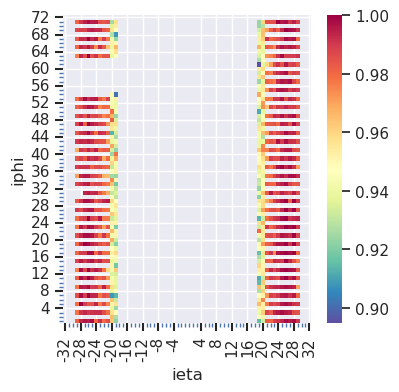

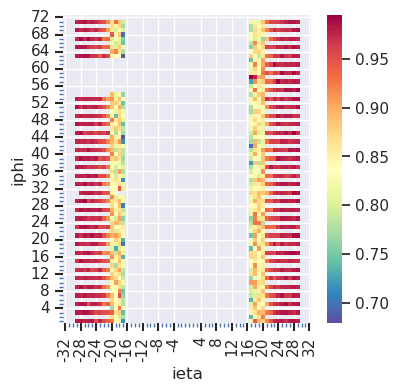

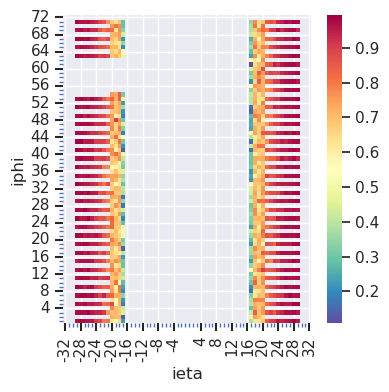

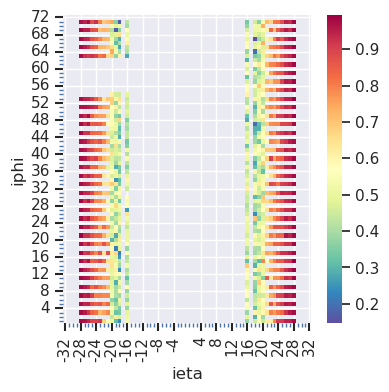

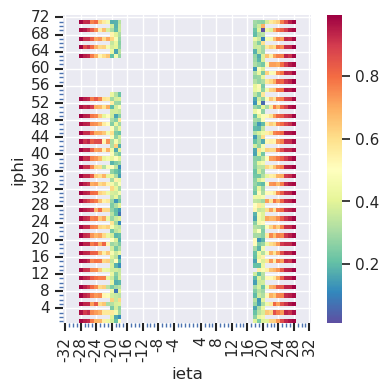

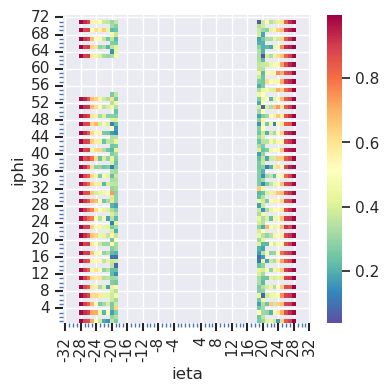

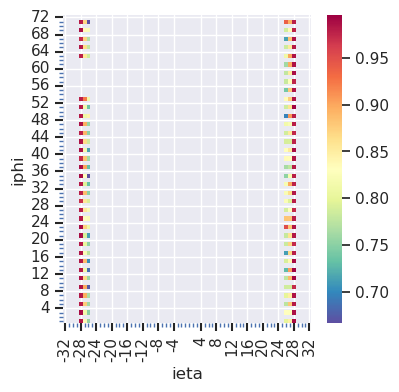

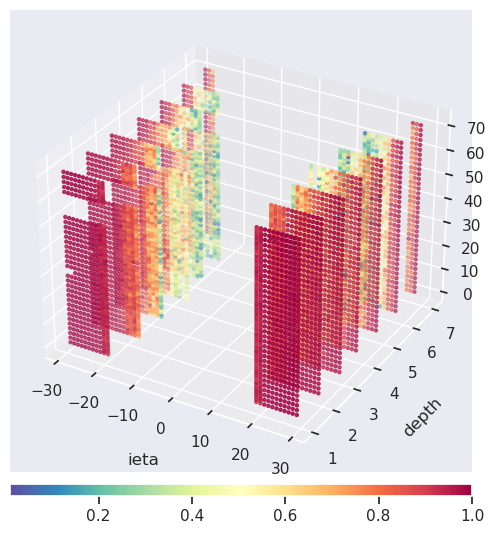

In [79]:
# visualize
ls_sel = 5
for d in range(model_train_data_iid_2018.shape()[-2]):
    util.plot_2d_heatmap(model_train_data_iid_2018.get_np()[0][ls_sel,0,...,d, 0], 
                        axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]], 
                        figsize=(4, 4), 
                        mask="positive", 
                        axes_labels=["ieta", "iphi"])

util.plot_hist3d_heatmap(model_train_data_iid_2018.get_np()[0][ls_sel,0,...,:, 0].transpose((0, 2, 1)), 
                        axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                        axes_labels=["ieta", "depth", "iphi"],
                        figsize=(6, 6), 
                        mask="positive", 
                    )

### Modeling Test Dataset

In [80]:
year_2018 = 2018
test_dataset_filedirpath_2018 = rf"{data_path}/HE/{subdetector_name}_test_dataset_{year_2018}"
test_dataset_filedirpath_2018

'/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018'

In [81]:
# inherits config from the training dataset
datatype="iid"
data_kwargs = dict(datatype=datatype,
                    subdetector_name = subdetector_name,
                    input_scaling_alg = "minmax",
                    memorysize = 5,
                    istrain = False,
                    data_dirpath = test_dataset_filedirpath_2018,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc/HE",
                    data_filename = f"test_dataset_{datatype}",
                    trainnref_filename = f"train_dataset_{datatype}"
                    )
prepare_model_temporal_torch_dataset(**data_kwargs)

prepare_model_temporal_torch_dataset...
{}
Testing Dataset preparation ....
dqm_dataset_loader...
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data.npy
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_meta_data.json
dataset size: (2156, 64, 72, 7, 1)
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_iid.pkl
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)
############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (2156, 64, 72, 7, 1)
preprocessing...: (2156, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 1 False True
generating 

### 2022

### Modeling Training Dataset

In [82]:
year_2022 = 2022
train_dataset_filedirpath_2022 = rf"{data_path}/HE/{subdetector_name}_train_dataset_{year_2022}"
train_dataset_filedirpath_2022

'/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2022'

In [83]:
datatype="iid"
data_kwargs = dict(datatype=datatype,
                    subdetector_name = subdetector_name,
                    input_scaling_alg = "minmax",
                    memorysize = 5, # timewidow size  1, means temporal learning enabled
                    istrain = True,
                    data_dirpath = train_dataset_filedirpath_2022,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HE",
                    data_filename = f"train_dataset_{datatype}",
                    trainnref_filename = None
                    )
prepare_model_temporal_torch_dataset(**data_kwargs)

prepare_model_temporal_torch_dataset...
{}
Training Dataset preparation ....
dqm_dataset_loader...
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2022/train_data.npy
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2022/train_meta_data.json
dataset size: (2600, 64, 72, 7, 1)
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)
############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (2600, 64, 72, 7, 1)
preprocessing...: (2600, 64, 72, 7, 1)
data scaling via data transformation: minmax...
fitting data scaling using: minmax...
minmax is being used. make sure first outliers are cleaned in the data.
spatial ts slicer:  ts 1 False True
generating time series slices...
timewindow_size: 1
(2600, 1, 

### Modeling Testing Dataset

In [84]:
year_2022 = 2022
test_dataset_filedirpath_2022 = rf"{data_path}/HE/{subdetector_name}_test_dataset_{year_2022}"
test_dataset_filedirpath_2022

'/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022'

In [85]:
# inherits config from the training dataset
datatype="iid"
data_kwargs = dict(datatype=datatype,
                    subdetector_name = subdetector_name,
                    input_scaling_alg = "minmax",
                    memorysize = 5,
                    istrain = False,
                    data_dirpath = test_dataset_filedirpath_2022,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HE",
                    data_filename = f"test_dataset_{datatype}",
                    trainnref_filename = f"train_dataset_{datatype}"
                    )
prepare_model_temporal_torch_dataset(**data_kwargs)

prepare_model_temporal_torch_dataset...
{}
Testing Dataset preparation ....
dqm_dataset_loader...
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data.npy
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_meta_data.json
dataset size: (2830, 64, 72, 7, 1)
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_iid.pkl
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)
############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (2830, 64, 72, 7, 1)
preprocessing...: (2830, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 1 False True
generating 

### Temporal (TS)

# 2018

### Modeling training dataset

In [86]:
year_2018 = 2018
train_dataset_filedirpath_2018 = rf"{data_path}/HE/{subdetector_name}_train_dataset_{year_2018}"
train_dataset_filedirpath_2018

'/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2018'

In [87]:
datatype="ts"
data_kwargs = dict(datatype=datatype,
                    subdetector_name = subdetector_name,
                    input_scaling_alg = "minmax",
                    memorysize = 5, # timewidow size  1, means temporal learning enabled
                    istrain = True,
                    data_dirpath = train_dataset_filedirpath_2018,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc/HE",
                    data_filename = f"train_dataset_{datatype}",
                    trainnref_filename = None
                    )
prepare_model_temporal_torch_dataset(**data_kwargs)

prepare_model_temporal_torch_dataset...
{}
Training Dataset preparation ....
dqm_dataset_loader...
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2018/train_data.npy
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2018/train_meta_data.json
dataset size: (1000, 64, 72, 7, 1)
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)
############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (1000, 64, 72, 7, 1)
preprocessing...: (1000, 64, 72, 7, 1)
data scaling via data transformation: minmax...
fitting data scaling using: minmax...
minmax is being used. make sure first outliers are cleaned in the data.
spatial ts slicer:  ts 5 False True
generating time series slices...
timewindow_size: 5
(200, 5, 6

In [88]:
model_train_data_ts_2018 = util.load_pickle("{}/{}_{}_{}.pkl".format(data_path,
            data_kwargs["dataset"].replace('/', '_'), data_kwargs["subdetector_name"], data_kwargs["data_filename"]))

model_train_data_ts_2018.shape()
model_train_data_ts_2018.mask.shape
model_train_data_ts_2018.get_np()[0].shape

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_ts.pkl


torch.Size([200, 5, 64, 72, 7, 1])

(64, 72, 7)

(200, 5, 64, 72, 7, 1)

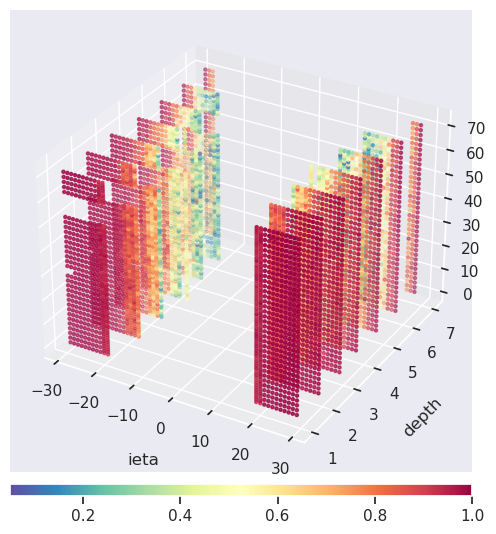

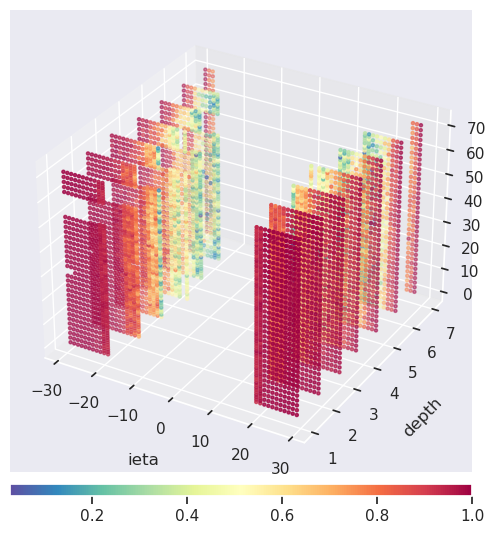

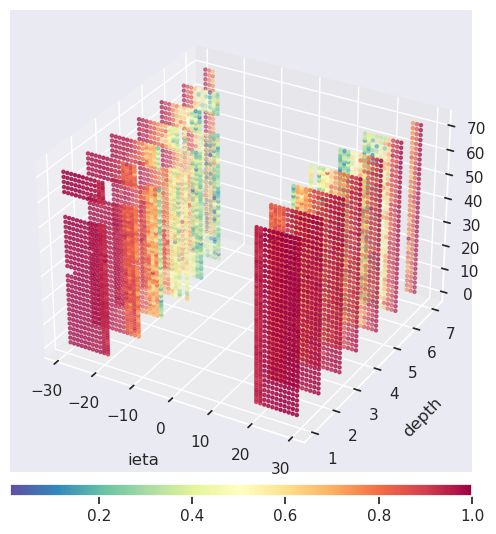

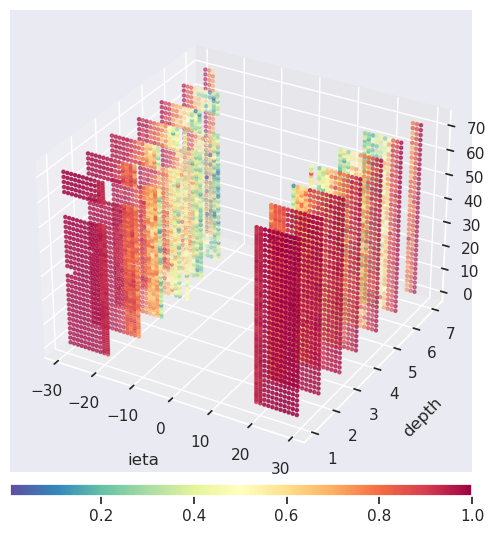

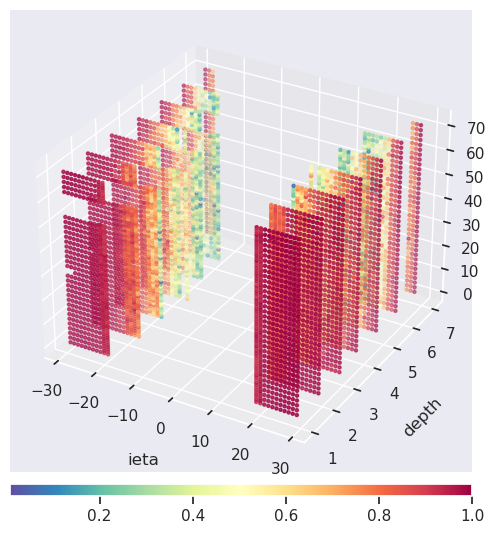

In [89]:
# visualize
ls_sel = 5
# t = 0 
# for d in range(model_train_data.shape()[-2]):
#     util.plot_2d_heatmap(model_train_data_ts.get_np()[0][ls_sel,t,...,d, 0], 
#                         axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]], 
#                         figsize=(4, 4), 
#                         mask="positive", 
#                         axes_labels=["ieta", "iphi"])

for t in range(model_train_data_ts_2018.shape()[1]):
    util.plot_hist3d_heatmap(model_train_data_ts_2018.get_np()[0][ls_sel,t,...,:, 0].transpose((0, 2, 1)), 
                            axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                            axes_labels=["ieta", "depth", "iphi"],
                            figsize=(6, 6), 
                            mask="positive", 
                        )

### Modeling testing dataset

In [91]:
year_2018 = 2018
test_dataset_filedirpath_2018 = rf"{data_path}/HE/{subdetector_name}_test_dataset_{year_2018}"
test_dataset_filedirpath_2018

'/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018'

In [92]:
# inherits config from the training dataset

# inherits config from the training dataset
datatype="ts"
data_kwargs = dict(datatype=datatype,
                    subdetector_name = subdetector_name,
                    input_scaling_alg = "minmax",
                    memorysize = 5,
                    istrain = False,
                    data_dirpath = test_dataset_filedirpath_2018,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc/HE",
                    data_filename = "test_dataset_ts",
                    trainnref_filename = f"train_dataset_{datatype}"
                    )
prepare_model_temporal_torch_dataset(**data_kwargs)

prepare_model_temporal_torch_dataset...
{}
Testing Dataset preparation ....
dqm_dataset_loader...
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data.npy
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_meta_data.json
dataset size: (2156, 64, 72, 7, 1)
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_ts.pkl
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)
############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (2156, 64, 72, 7, 1)
preprocessing...: (2156, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 5 False True
generating t

# 2022

### Modeling Training Dataset

In [93]:
year_2022 = 2022
train_dataset_filedirpath_2022 = rf"{data_path}/HE/{subdetector_name}_train_dataset_{year_2022}"
train_dataset_filedirpath_2022

'/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2022'

In [94]:
datatype="ts"
data_kwargs = dict(datatype=datatype,
                    subdetector_name = subdetector_name,
                    input_scaling_alg = "minmax",
                    memorysize = 5, # timewidow size  1, means temporal learning enabled
                    istrain = True,
                    data_dirpath = train_dataset_filedirpath_2022,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HE",
                    data_filename = f"train_dataset_{datatype}",
                    trainnref_filename = None
                    )
prepare_model_temporal_torch_dataset(**data_kwargs)

prepare_model_temporal_torch_dataset...
{}
Training Dataset preparation ....
dqm_dataset_loader...
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2022/train_data.npy
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_train_dataset_2022/train_meta_data.json
dataset size: (2600, 64, 72, 7, 1)
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)
############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (2600, 64, 72, 7, 1)
preprocessing...: (2600, 64, 72, 7, 1)
data scaling via data transformation: minmax...
fitting data scaling using: minmax...
minmax is being used. make sure first outliers are cleaned in the data.
spatial ts slicer:  ts 5 False True
generating time series slices...
timewindow_size: 5
(520, 5, 6

### Modeling Testing Dataset

In [95]:
year_2022 = 2022
test_dataset_filedirpath_2022 = rf"{data_path}/HE/{subdetector_name}_test_dataset_{year_2022}"
test_dataset_filedirpath_2022

'/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022'

In [96]:
# inherits config from the training dataset
datatype="ts"
data_kwargs = dict(datatype=datatype,
                    subdetector_name = subdetector_name,
                    input_scaling_alg = "minmax",
                    memorysize = 5,
                    istrain = False,
                    data_dirpath = test_dataset_filedirpath_2022,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HE",
                    data_filename = "test_dataset_ts",
                    trainnref_filename = f"train_dataset_{datatype}"
                    )
prepare_model_temporal_torch_dataset(**data_kwargs)

prepare_model_temporal_torch_dataset...
{}
Testing Dataset preparation ....
dqm_dataset_loader...
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data.npy
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_meta_data.json
dataset size: (2830, 64, 72, 7, 1)
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_ts.pkl
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)
############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (2830, 64, 72, 7, 1)
preprocessing...: (2830, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 5 False True
generating t

In [97]:
model_test_data_ts_2022 = util.load_pickle("{}/{}_{}_{}.pkl".format(data_path,
            data_kwargs["dataset"].replace('/', '_'), data_kwargs["subdetector_name"], data_kwargs["data_filename"]))

model_test_data_ts_2022.shape
model_test_data_ts_2022.mask.shape
model_test_data_ts_2022.get_np()[0].shape

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_test_dataset_ts.pkl


<bound method DatasetTemplate.shape of <model_datasets.DatasetTemplate object at 0x2b6b7541ead0>>

(64, 72, 7)

(566, 5, 64, 72, 7, 1)

### Scripts

In [98]:
#Replace here with the appropriate directory as the one above. Also, the dataset name should be the same as the one above.


# non temporal
# TRAIN
# python model_datasets.py -it -s he -d ts -m 1 -is minmax -ds HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB -np "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data\HBHE\he_train_dataset" -td he_train_dataset_iid 
# TEST
# python model_datasets.py -s he -d ts -m 1 -is minmax -ds HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB -np "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data\HBHE\he_train_dataset" -td he_test_dataset_iid -tr "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data\HBHE\he_train_dataset_ts.pkl"


# temporal
# TRAIN
# python model_datasets.py -it -s he -d ts -m 5 -is minmax -ds HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB -np "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data\HBHE\he_train_dataset" -td he_train_dataset_ts 

# TEST
# python model_datasets.py -s he -d ts -m 5 -is minmax -ds HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB -np "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data\HBHE\he_train_dataset" -td he_test_dataset_ts -tr "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data\HBHE\he_train_dataset_iid.pkl"


# !python ../src/model_datasets.py -it -s he -d ts -m 5 -is minmax -ds "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB" -np "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data\HBHE\he_train_dataset" -td he_train_dataset_ts 

# AD Model Network

In [6]:
# from torchsummaryX import summary
from torchinfo import summary
import random
import argparse
import json
import copy
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
import utilities as util

from torch.utils.data import DataLoader, SubsetRandomSampler
from torch.autograd import Variable
import torch.optim as optim
import torch.nn as nn
import torch
from collections import OrderedDict

In [7]:
# load model net
from models_spatial import *

## Model Architecture Check

### Temporal Model

#### Training on 2018 DATA

In [8]:
# load model trainer
from models_spatial import *
from model_trainer import *

In [9]:
device = "cuda"

#### Create AD model: CNNGNNRNNAE_MultiDim_SPATIAL: GraphSTAD

In [10]:
# link data

he_node_edge_index = util.load_npdata(rf"{data_path}/HCAL_CONFIG/he_graph_edge_array_indices_depth.npy")
he_node_edge_index.shape
# source_node_id, destination_node_id

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_graph_edge_array_indices_depth.npy


(2, 1265616)

In [11]:
gc.collect()
torch.cuda.empty_cache()

31

## Model Training and Validation

### Temporal Model

### Model 1 (CNN(1d/2d/3d)+RNN+VAE)

##### Training

In [12]:
model1_kwargs = {
        "model_alg": "CNNRNNAE_MultiDim_SPATIAL",
        "dataset": "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc/HE",
        "train_data_filename": "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_ts",
        "data_dirpath": data_path,   
        "e_num_conv_layers": 4,
        "latent_dim": 32,  # [2, 4, 8, 16, 32] increase this to improve accuracy and reduce to speed up training
        "rnn_model": "lstm",
        "isvariational": True,
        "reg_beta": 0.001,
        "shuffle": True,
        "isplot": False,
        "num_epochs": 250,
        "early_stop_epoch": 20,
        "verbose": 1,
        "learning_rate": 0.001,
        "weight_decay": 1e-7,
        "batch_size": 8,
        "train_size_perc": 1.00,
        "optimizer": "adam"
    }

ad_model_generator(**model1_kwargs)

{}
loading train_data: HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_ts...
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_ts.pkl
feature_dim: torch.Size([200, 5, 64, 72, 7, 1]) target_dim: torch.Size([200, 5, 64, 72, 7, 1])
{'dataset_name': 'HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE', 'source_files': None, 'datatype': 'ts', 'timewindow_size': 5, 'istrain': True, 'input_scaling_alg': 'minmax', 'input_scaler': MinMaxScaler(), 'isdata_scaled': True, 'mask': array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  Tr

### Model 2 (CNN(1d/2d/3d)+GNN+RNN+VAE)

In [13]:
#    CNN(1d/2d/3d)+GNN+RNN+VAE

model2_kwargs = {
        "model_alg": "CNNGNNRNNAE_MultiDim_SPATIAL",
        "dataset": "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc/HE",
        "train_data_filename": "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_ts",
        "data_dirpath": data_path,   
        "e_num_conv_layers": 4,
        "latent_dim": 32,  # [2, 4, 8, 16, 32] increase this to improve accuracy and reduce to speed up training
        "rnn_model": "lstm",
        "isvariational": True,
        "reg_beta": 0.001,
        "shuffle": True,
        "isplot": False,
        "num_epochs": 250,
        "early_stop_epoch": 20,
        "verbose": 1,
        "learning_rate": 0.01, #Here, learning rate should be set to 0.01
        "weight_decay": 1e-7,
        "batch_size": 8,
        "train_size_perc": 1.00,
        "optimizer": "adam",
        "use_graphstad_optimizer": True,
        "node_edge_index_filename": rf"{data_path}/HCAL_CONFIG/he_graph_edge_array_indices_depth.npy",
    }
ad_model_generator(**model2_kwargs)

{}
loading train_data: HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_ts...
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_ts.pkl
feature_dim: torch.Size([200, 5, 64, 72, 7, 1]) target_dim: torch.Size([200, 5, 64, 72, 7, 1])
{'dataset_name': 'HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE', 'source_files': None, 'datatype': 'ts', 'timewindow_size': 5, 'istrain': True, 'input_scaling_alg': 'minmax', 'input_scaler': MinMaxScaler(), 'isdata_scaled': True, 'mask': array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  Tr

### Model 3 (DepthViT)

In [17]:
model3_kwargs = {
        "model_alg": "DepthwiseCrossViTAE_MultiDim_SPATIAL",
        "dataset": "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc/HE",
        "train_data_filename": "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_iid",
        "data_dirpath": data_path,   
        "e_num_conv_layers": 4,
        "latent_dim": 56,  # [2, 4, 8, 16, 32] increase this to improve accuracy and reduce to speed up training
        "rnn_model": "lstm",
        "isvariational": True,
        "reg_beta": 0.001,
        "shuffle": True,
        "isplot": False,
        "num_epochs": 250,
        "early_stop_epoch": 20,
        "verbose": 1,
        "learning_rate": 0.001,
        "weight_decay": 1e-7,
        "batch_size": 8,
        "train_size_perc": 1.00,
        "optimizer": "adam",
        "patch_size": 12,
        "k_factor": 8,
        "num_layers": 5,
        "mlp_dim": 56,
        "dropout": 0.1,
        "attention_dropout": 0.1,
        "mask_ratio": 0.5,
        "image_size": [64,72],  # Default image size
    }

ad_model_generator(**model3_kwargs)

{}
loading train_data: HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_iid...
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_iid.pkl
feature_dim: torch.Size([1000, 1, 64, 72, 7, 1]) target_dim: torch.Size([1000, 1, 64, 72, 7, 1])
{'dataset_name': 'HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE', 'source_files': None, 'datatype': 'ts', 'timewindow_size': 1, 'istrain': True, 'input_scaling_alg': 'minmax', 'input_scaler': MinMaxScaler(), 'isdata_scaled': True, 'mask': array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,

In [ ]:
gc.collect()
torch.cuda.empty_cache()

##### Scripts

In [31]:
# # non-temporal
# !python ../src/model_trainer.py -ma CNNFNNAE_MultiDim_SPATIAL -ds HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB -dp "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data" -td HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HEHB_he_train_dataset_iid

In [32]:
# # temporal
# !python ../src/model_trainer.py -ma CNNRNNAE_MultiDim_SPATIAL -ds HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB -dp "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data" -td HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HEHB_he_train_dataset_ts 

### 2018 (CNNRNNVAE_MultiDim_SPATIAL)

In [33]:
# # # temporal 
# !python ../src/model_trainer.py -ma CNNRNNAE_MultiDim_SPATIAL -ds HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc/HE -dp "/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM/data" -td HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_train_dataset_ts -k "{\"e_num_conv_layers\": 3, \"latent_dim\": 4, \"rnn_model\": \"lstm\", \"latent_dim\": 4, \"shuffle\": True, \"num_epochs\": True \"learning_rate\": 0.001, \"num_epochs\": 20, \"batch_size\": 8}"

In [34]:
# # temporal + graph, increase learning rate to 0.01
# !python ../src/model_trainer.py -ma CNNGNNRNNAE_MultiDim_SPATIAL -ds HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB -km "{\"node_edge_index_filename\":\"C:\\Users\\mulugetawa\\OneDrive - Universitetet i Agder\\CERN\\InductionProject\\CMS_HCAL_ML_OnlineDQM\\data\\HCAL_CONFIG\\he_graph_edge_array_indices_depth.npy\"}" -dp "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data" -td HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HEHB_he_train_dataset_ts 

#### GraphSTAD_Optimizer

In [35]:
# # temporal + graph + GraphSTAD_Optimizer: RIN
# !python ../src/model_trainer.py -ma CNNGNNRNNAE_MultiDim_SPATIAL -ds HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB -km "{\"use_graphstad_optimizer\":\"true\", \"node_edge_index_filename\":\"C:\\Users\\mulugetawa\\OneDrive - Universitetet i Agder\\CERN\\InductionProject\\CMS_HCAL_ML_OnlineDQM\\data\\HCAL_CONFIG\\he_graph_edge_array_indices_depth.npy\"}" -dp "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data" -td HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HEHB_he_train_dataset_ts

In [36]:
# # temporal + GraphSTAD_Optimizer: RIN
# !python ../src/model_trainer.py -ma CNNRNNAE_MultiDim_SPATIAL -ds HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB -km "{\"use_graphstad_optimizer\":\"true\", \"subdetector_name\":\"he\"}" -dp "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data" -td HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HEHB_he_train_dataset_ts

In [37]:
# # temporal + GraphSTAD_Optimizer: DC + RIN
# !python ../src/model_trainer.py -ma CNNRNNAE_MultiDim_SPATIAL -ds HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HEHB -km "{\"use_graphstad_optimizer\":\"true\", \"subdetector_name\":\"he\", \"use_spatial_split\":\"true\"}" -dp "C:\Users\mulugetawa\OneDrive - Universitetet i Agder\CERN\InductionProject\CMS_HCAL_ML_OnlineDQM\data" -td HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HEHB_he_train_dataset_ts

#### Testing

In [18]:
# from model_eval import *
from models_spatial import *

In [19]:
# MORE ANALYSIS TO BE ADDED SOON

##### Load Model

In [20]:
device = "cuda"

### Model 1

In [21]:
# this model is not fully-trained and used only to demonstrate how to make model prediction and result analysis
model1_dirpath_2018 = rf"{result_path}/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE/model/he_m_5_is_minmax_ns_1/CNNRNNAE_MultiDim_SPATIAL_649"
model1_filepath_2018 = rf"{model1_dirpath_2018}/AE_MODEL.pkl"
model1_dict_2018 = util.load_pickle(model1_filepath_2018)

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/results/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE/model/he_m_5_is_minmax_ns_1/CNNRNNAE_MultiDim_SPATIAL_649/AE_MODEL.pkl


In [22]:
admodel1_2018 = model1_dict_2018["model"]
admodel1_2018.get_encoded = False
admodel1_2018.keep_hidden_states = False
admodel1_2018.model_data_format = False
admodel1_2018 = admodel1_2018.to(device)

### Model 2

In [23]:
# this model is not fully-trained and used only to demonstrate how to make model prediction and result analysis
model2_dirpath_2018 = rf"{result_path}/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE/model/he_m_5_is_minmax_ns_1/GraphSTAD_RIN_DC__CNNGNNRNNAE_MultiDim_SPATIAL_3112"
model2_filepath_2018 = rf"{model2_dirpath_2018}/AE_MODEL.pkl"
model2_dict_2018 = util.load_pickle(model2_filepath_2018)

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/results/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE/model/he_m_5_is_minmax_ns_1/GraphSTAD_RIN_DC__CNNGNNRNNAE_MultiDim_SPATIAL_3112/AE_MODEL.pkl


In [24]:
admodel2_2018 = model2_dict_2018["model"]
admodel2_2018.get_encoded = False
admodel2_2018.keep_hidden_states = False
admodel2_2018.model_data_format = False
admodel2_2018 = admodel2_2018.to(device)

### Model 3

In [26]:
# this model is not fully-trained and used only to demonstrate how to make model prediction and result analysis
model3_dirpath_2018 = rf"{result_path}/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE/model/he_m_1_is_minmax_ns_1/DepthwiseCrossViTAE_MultiDim_SPATIAL_4034"
model3_filepath_2018 = rf"{model3_dirpath_2018}/AE_MODEL.pkl"
model3_dict_2018 = util.load_pickle(model3_filepath_2018)

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/results/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE/model/he_m_1_is_minmax_ns_1/DepthwiseCrossViTAE_MultiDim_SPATIAL_4034/AE_MODEL.pkl


In [27]:
admodel3_2018 = model3_dict_2018["model"]
admodel3_2018.get_encoded = False
admodel3_2018.keep_hidden_states = False
admodel3_2018.model_data_format = False
admodel3_2018 = admodel3_2018.to(device)

##### Load Test Dataset

### Temporal

In [28]:
datatype="ts"
subdetector_name="he"
data_kwargs_2018 = dict(
                    subdetector_name = subdetector_name,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc/HE",
                    data_filename = "test_dataset_ts"
                    )

model_test_data_ts_2018 = util.load_pickle("{}/{}_{}_{}.pkl".format(data_path,
            data_kwargs_2018["dataset"].replace('/', '_'), data_kwargs_2018["subdetector_name"], data_kwargs_2018["data_filename"]))

model_test_data_ts_2018.shape
model_test_data_ts_2018.mask.shape
model_test_data_ts_2018.get_np()[0].shape

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_test_dataset_ts.pkl


<bound method DatasetTemplate.shape of <model_datasets.DatasetTemplate object at 0x2b2c3bd12ec0>>

(64, 72, 7)

(431, 5, 64, 72, 7, 1)

### Nontemporal

In [29]:
datatype="iid"
subdetector_name="he"
data_kwargs_2018 = dict(
                    subdetector_name = subdetector_name,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc/HE",
                    data_filename = "test_dataset_iid"
                    )

model_test_data_iid_2018 = util.load_pickle("{}/{}_{}_{}.pkl".format(data_path,
            data_kwargs_2018["dataset"].replace('/', '_'), data_kwargs_2018["subdetector_name"], data_kwargs_2018["data_filename"]))

model_test_data_iid_2018.shape
model_test_data_iid_2018.mask.shape
model_test_data_iid_2018.get_np()[0].shape

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2018__cut20fc_HE_he_test_dataset_iid.pkl


<bound method DatasetTemplate.shape of <model_datasets.DatasetTemplate object at 0x2b2c4021d2a0>>

(64, 72, 7)

(2156, 1, 64, 72, 7, 1)

##### Model Prediction (Data Reconstruction)

### Model 1

In [30]:
with torch.no_grad():
    pred1_dict_2018 = admodel1_2018.predict(model_test_data_ts_2018)
    pred1_dict_2018.keys()

torch.Size([431, 5, 64, 72, 7, 1]) torch.Size([431, 5, 64, 72, 7, 1])
model prediction...


100%|█████████████████████████████████████████████████████████████████████████| 431/431 [00:04<00:00, 102.75it/s]


done!
input_data.shape:  torch.Size([431, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([431, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(431, 5, 64, 72, 7, 1), output shape: (2155, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(431, 5, 64, 72, 7, 1), output shape: (2155, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(431, 5, 64, 72, 7, 1), output shape: (2155, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([431, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(431, 5, 64, 72, 7, 1), 

dict_keys(['target_data', 'pred_data', 'pred_err_spatial', 'pred_err_window_spatial'])

In [31]:
for k,v in pred1_dict_2018.items():
    print(f"{k}: {v.shape}")

target_data: torch.Size([2155, 64, 72, 7, 1])
pred_data: torch.Size([2155, 64, 72, 7, 1])
pred_err_spatial: torch.Size([2155, 64, 72, 7, 1])
pred_err_window_spatial: torch.Size([2155, 64, 72, 7, 1])


In [32]:
for k,v in pred1_dict_2018.items():
    if "err" in k:
        print(f"MSE ({k}): ", v[:, ~model_test_data_ts_2018.mask, :].nanmean())
        print(f"MSE ({k}): ", v[:, ~model_test_data_ts_2018.mask, :].std())

MSE (pred_err_spatial):  tensor(0.0742)
MSE (pred_err_spatial):  tensor(0.0691)
MSE (pred_err_window_spatial):  tensor(0.0742)
MSE (pred_err_window_spatial):  tensor(0.0399)


##### Result Visualization and Performance Analysis

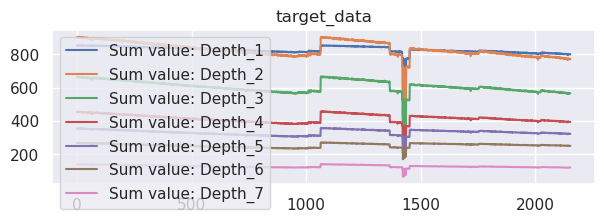

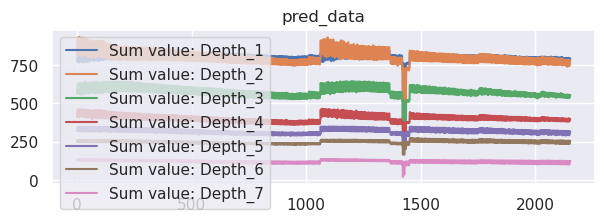

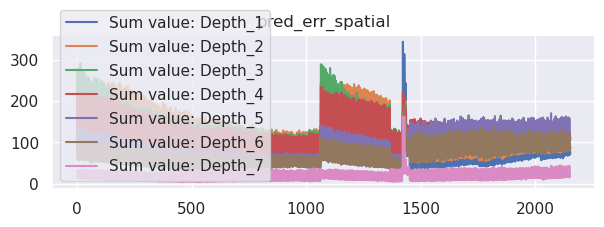

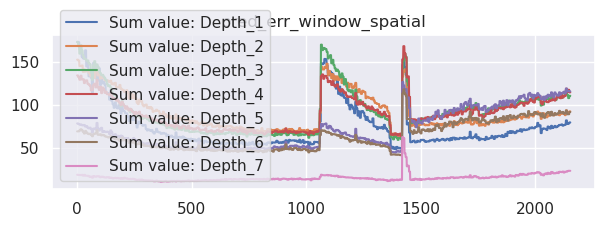

In [33]:
for k,v in pred1_dict_2018.items():
    fig, ax = plt.subplots(figsize=(7, 2))
    _ = ax.plot(v.sum(axis=(1, 2, 4)))
    _ = plt.title(k)
    _ = plt.legend([f"Sum value: Depth_{d}" for d in range(1, v.shape[-2]+1)])
    _ = plt.show()

torch.Size([64, 7, 72])

torch.Size([64, 7, 72])

torch.Size([64, 7, 72])

torch.Size([64, 7, 72])

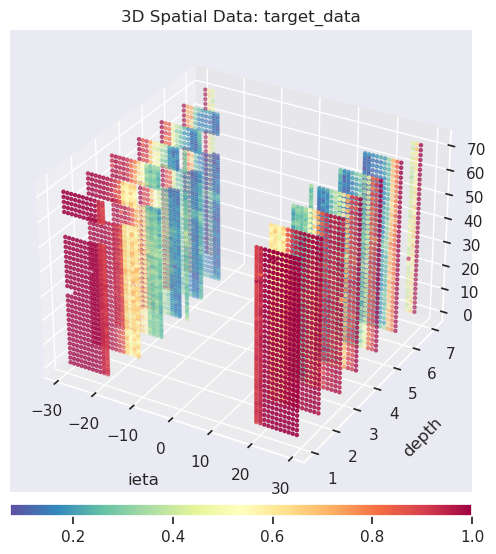

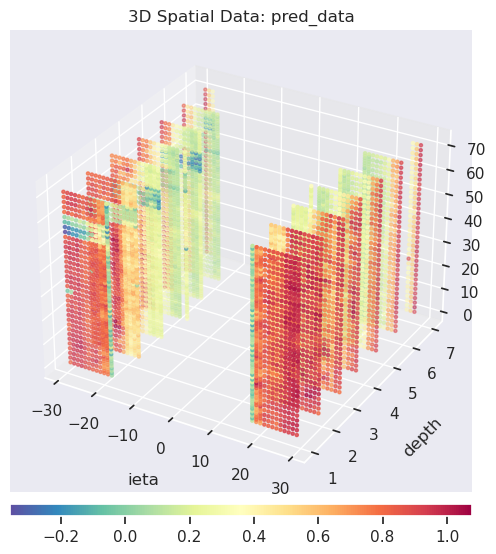

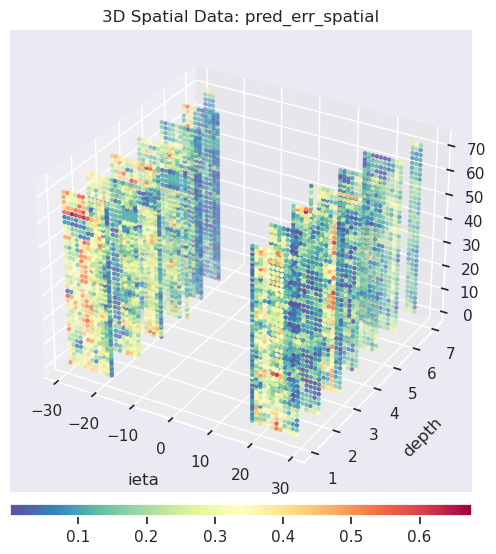

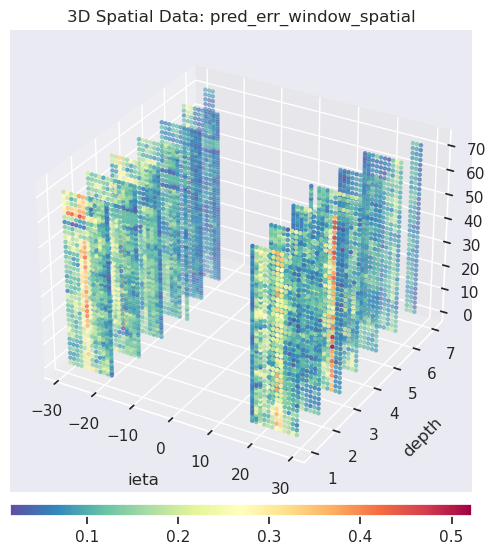

In [34]:
ls_sel = 10
for k,v in pred1_dict_2018.items():
    v[ls_sel,..., 0].permute((0, 2, 1)).shape
    util.plot_hist3d_heatmap(v[ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
                        axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                        axes_labels=["ieta", "depth", "iphi"],
                        figsize=(6, 6), 
                        mask="positive", title=f"3D Spatial Data: {k}"
                    )

In [35]:
gc.collect()
torch.cuda.empty_cache()

62664

### Model 2

In [36]:
with torch.no_grad():
    pred2_dict_2018 = admodel2_2018.predict(model_test_data_ts_2018)
    pred2_dict_2018.keys()

torch.Size([431, 5, 64, 72, 7, 1]) torch.Size([431, 5, 64, 72, 7, 1])
model prediction...


100%|██████████████████████████████████████████████████████████████████████████| 431/431 [00:23<00:00, 18.66it/s]


done!
input_data.shape:  torch.Size([431, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([431, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(431, 5, 64, 72, 7, 1), output shape: (2155, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(431, 5, 64, 72, 7, 1), output shape: (2155, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(431, 5, 64, 72, 7, 1), output shape: (2155, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([431, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(431, 5, 64, 72, 7, 1), 

dict_keys(['target_data', 'pred_data', 'pred_err_spatial', 'pred_err_window_spatial'])

In [37]:
for k,v in pred2_dict_2018.items():
    print(f"{k}: {v.shape}")

target_data: torch.Size([2155, 64, 72, 7, 1])
pred_data: torch.Size([2155, 64, 72, 7, 1])
pred_err_spatial: torch.Size([2155, 64, 72, 7, 1])
pred_err_window_spatial: torch.Size([2155, 64, 72, 7, 1])


In [38]:
for k,v in pred2_dict_2018.items():
    if "err" in k:
        print(f"MSE ({k}): ", v[:, ~model_test_data_ts_2018.mask, :].nanmean())
        print(f"MSE ({k}): ", v[:, ~model_test_data_ts_2018.mask, :].std())

MSE (pred_err_spatial):  tensor(0.0503)
MSE (pred_err_spatial):  tensor(0.0551)
MSE (pred_err_window_spatial):  tensor(0.0503)
MSE (pred_err_window_spatial):  tensor(0.0408)


In [39]:
### Visualization

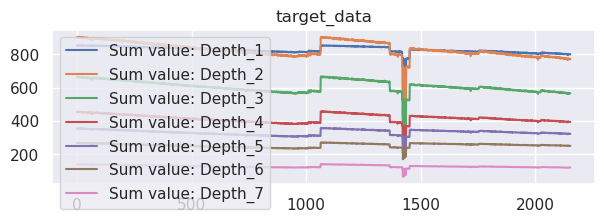

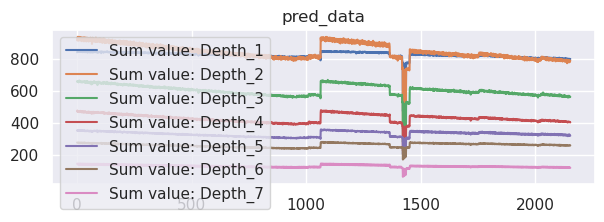

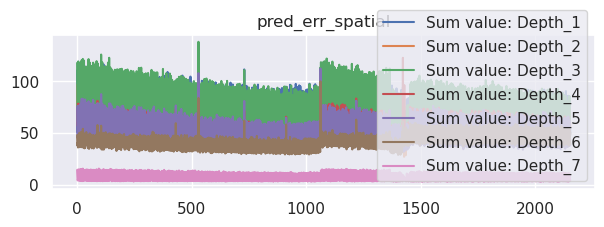

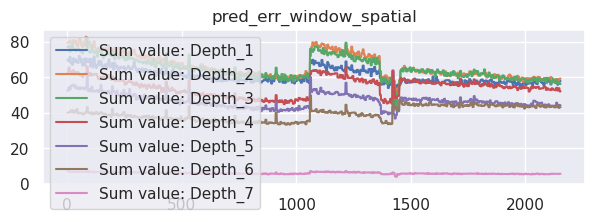

In [42]:
for k,v in pred2_dict_2018.items():
    fig, ax = plt.subplots(figsize=(7, 2))
    _ = ax.plot(v.sum(axis=(1, 2, 4)))
    _ = plt.title(k)
    _ = plt.legend([f"Sum value: Depth_{d}" for d in range(1, v.shape[-2]+1)])
    _ = plt.show()

torch.Size([64, 7, 72])

torch.Size([64, 7, 72])

torch.Size([64, 7, 72])

torch.Size([64, 7, 72])

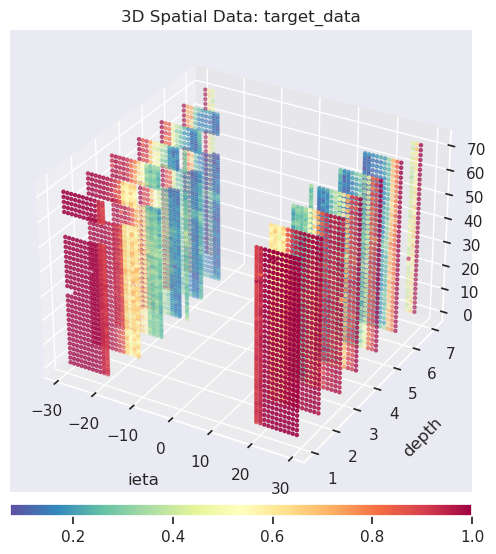

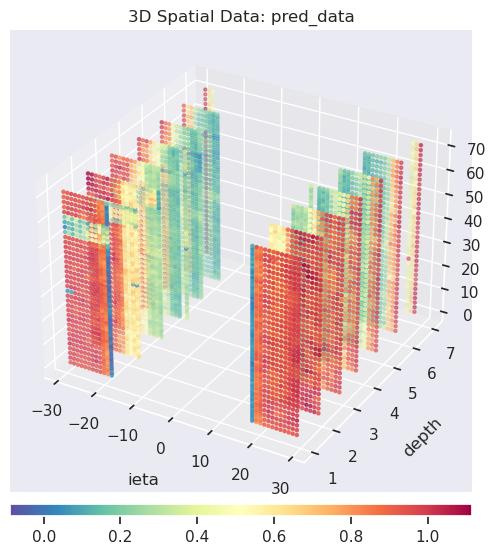

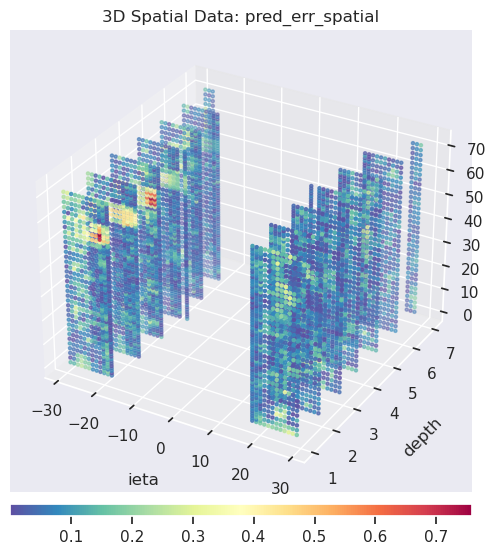

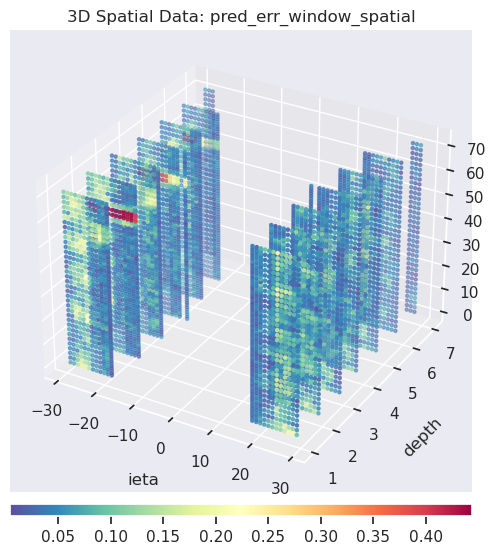

In [43]:
ls_sel = 10
for k,v in pred2_dict_2018.items():
    v[ls_sel,..., 0].permute((0, 2, 1)).shape
    util.plot_hist3d_heatmap(v[ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
                        axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                        axes_labels=["ieta", "depth", "iphi"],
                        figsize=(6, 6), 
                        mask="positive", title=f"3D Spatial Data: {k}"
                    )

### Model 3

In [44]:
with torch.no_grad():
    pred3_dict_2018 = admodel3_2018.predict(model_test_data_iid_2018)
    pred3_dict_2018.keys()

torch.Size([2156, 1, 64, 72, 7, 1]) torch.Size([2156, 1, 64, 72, 7, 1])
model prediction...


100%|████████████████████████████████████████████████████████████████████████| 2156/2156 [01:11<00:00, 30.08it/s]


done!
input_data.shape:  torch.Size([2156, 1, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([2156, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(2156, 1, 64, 72, 7, 1), output shape: (2156, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(2156, 1, 64, 72, 7, 1), output shape: (2156, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(2156, 1, 64, 72, 7, 1), output shape: (2156, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([2156, 1, 64, 72, 7, 1])
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(2156, 1, 64, 72, 

dict_keys(['target_data', 'pred_data', 'pred_err_spatial', 'pred_err_window_spatial'])

In [45]:
for k,v in pred3_dict_2018.items():
    print(f"{k}: {v.shape}")

target_data: torch.Size([2156, 64, 72, 7, 1])
pred_data: torch.Size([2156, 64, 72, 7, 1])
pred_err_spatial: torch.Size([2156, 64, 72, 7, 1])
pred_err_window_spatial: torch.Size([2156, 64, 72, 7, 1])


In [46]:
for k,v in pred3_dict_2018.items():
    if "err" in k:
        print(f"MSE ({k}): ", v[:, ~model_test_data_iid_2018.mask, :].nanmean())
        print(f"MSE ({k}): ", v[:, ~model_test_data_iid_2018.mask, :].std())

MSE (pred_err_spatial):  tensor(0.1203)
MSE (pred_err_spatial):  tensor(0.1136)
MSE (pred_err_window_spatial):  tensor(0.1203)
MSE (pred_err_window_spatial):  tensor(0.1136)


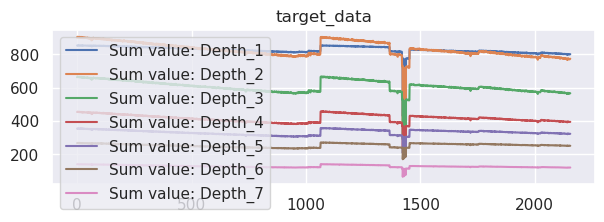

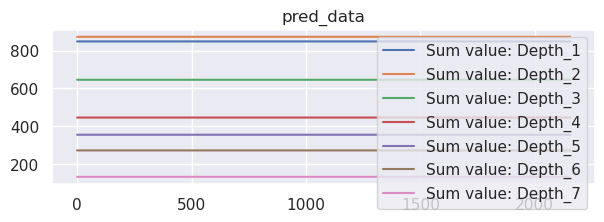

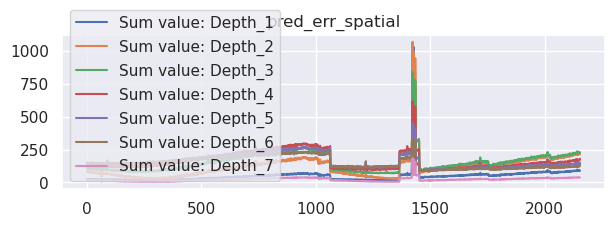

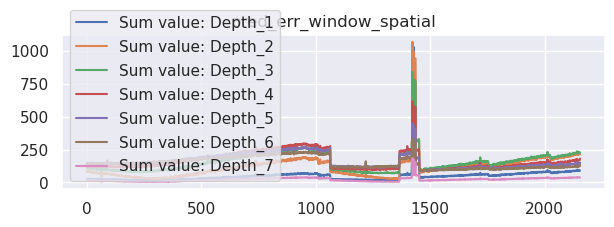

In [47]:
#Visualization
for k,v in pred3_dict_2018.items():
    fig, ax = plt.subplots(figsize=(7, 2))
    _ = ax.plot(v.sum(axis=(1, 2, 4)))
    _ = plt.title(k)
    _ = plt.legend([f"Sum value: Depth_{d}" for d in range(1, v.shape[-2]+1)])
    _ = plt.show()

torch.Size([64, 7, 72])

torch.Size([64, 7, 72])

torch.Size([64, 7, 72])

torch.Size([64, 7, 72])

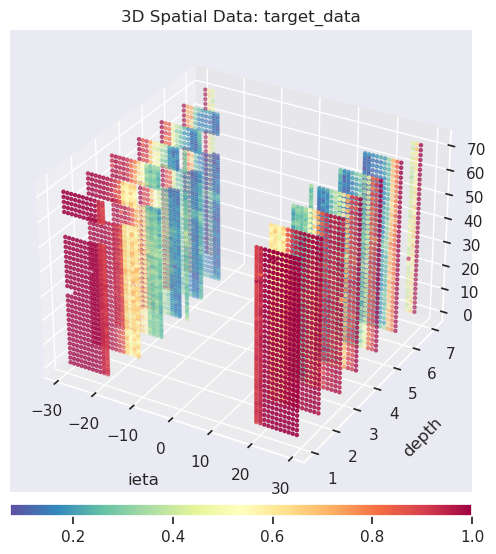

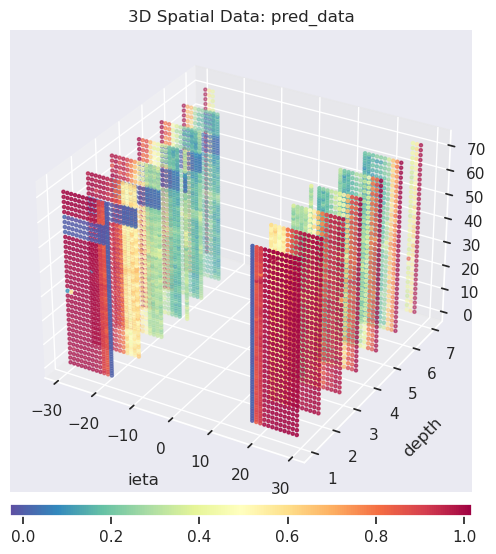

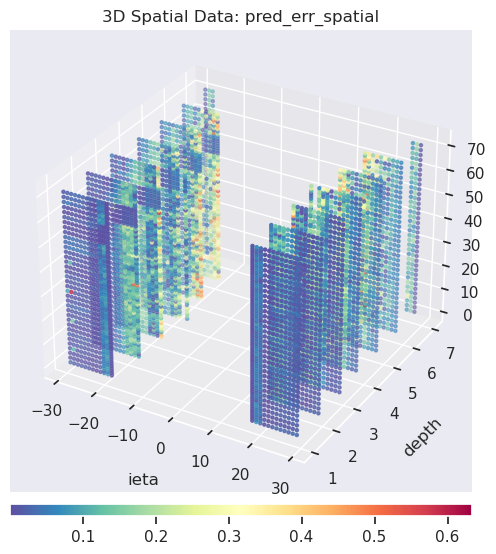

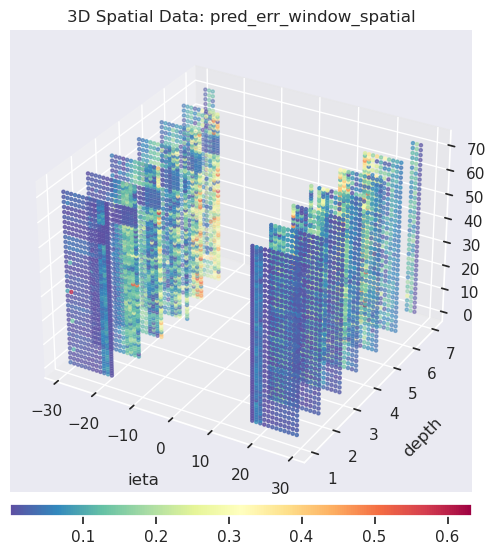

In [48]:
ls_sel = 10
for k,v in pred3_dict_2018.items():
    v[ls_sel,..., 0].permute((0, 2, 1)).shape
    util.plot_hist3d_heatmap(v[ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
                        axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                        axes_labels=["ieta", "depth", "iphi"],
                        figsize=(6, 6), 
                        mask="positive", title=f"3D Spatial Data: {k}"
                    )

#### AD testing (Synthetic Anomaly)

In [49]:
from synthetic_anomaly_generator import *

loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/hcal_digimap_3d_meta_template.json


##### Generating Synthetic Channel Anomaly Dataset

### 2018

In [50]:
dataset = "HE"
test_np_filename_2018 = "he_test_dataset_2018/test_data"
anml_gen_size = 10 # increase this more anomaly ls, like >1000
anml_tag = "anomaly_channel" # rename to give unique tag to the generated files

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)


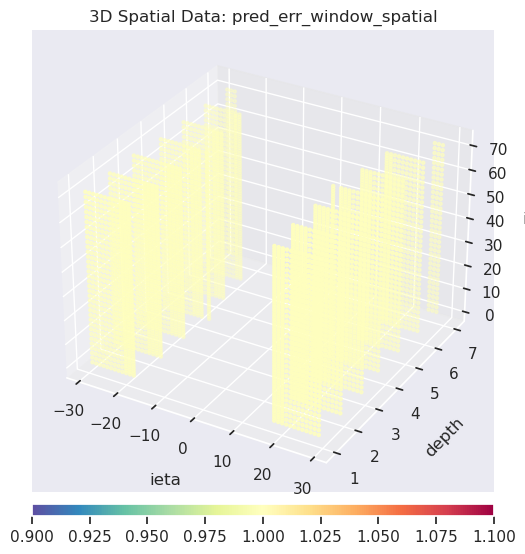

In [51]:
subdetector_mask = util.load_npdata(rf"{data_path}/HCAL_CONFIG/{subdetector_name}_segmentation_config_mask.npy").astype(bool)
print(f"hcal segmentation map is loaded: {subdetector_mask.shape}")

util.plot_hist3d_heatmap(subdetector_mask.transpose((0, 2, 1)), 
                    axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                    axes_labels=["ieta", "depth", "iphi"],
                    figsize=(6, 6), 
                    mask="positive", title=f"3D Spatial Data: {k}"
                )

In [52]:
# # script
!python ../src/synthetic_anomaly_generator.py -s he -ds HE -m 5 -df he_test_dataset_2018/test_data -gl 10 -gsd 101 -tg anomaly_channel --save

loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/hcal_digimap_3d_meta_template.json
Namespace(subdetector_name='he', datatype='ts', memorysize=5, dataset='HE', data_path='/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data', anml_gen_size=10, seed=101, test_np_filename='he_test_dataset_2018/test_data', anml_tag='anomaly_channel', save=True)
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)
{'mask': array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..

### 2022

In [53]:
dataset = "HE"
test_np_filename_2022 = "he_test_dataset_2022/test_data"
anml_gen_size = 10 # increase this more anomaly ls, like >1000
anml_tag = "anomaly_channel" # rename to give unique tag to the generated files

In [54]:
#Script

!python ../src/synthetic_anomaly_generator.py -s he -ds HE -m 5 -df he_test_dataset_2022/test_data -gl 10 -gsd 101 -tg anomaly_channel --save

loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/hcal_digimap_3d_meta_template.json
Namespace(subdetector_name='he', datatype='ts', memorysize=5, dataset='HE', data_path='/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data', anml_gen_size=10, seed=101, test_np_filename='he_test_dataset_2022/test_data', anml_tag='anomaly_channel', save=True)
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy
hcal segmentation map is loaded: (64, 72, 7)
{'mask': array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..

##### Loading and Visualization Anomaly Dataset (2018 - sample only)

In [55]:
objAnmlLoad = SyntheticDQMChannelAnomalyLoader(test_np_filename_2018, anml_gen_size=anml_gen_size, dataset=dataset)

anml_gen_dict, anml_gen_config = objAnmlLoad.load_anml_gen_dict(anml_tag="{}".format(anml_tag))
anml_gen_config
anml_gen_dict
data_np_nd_with_healthy_tw, data_np_nd_healthy_label_tw = objAnmlLoad.load_health_ls_used_for_amnl_gen(anml_tag=anml_tag)
data_np_nd_with_healthy_tw.shape
data_np_nd_with_anml, data_np_nd_anml_label = objAnmlLoad.load_generated_anml(anml_tag="{}".format(anml_tag))
data_np_nd_with_anml_tw_multiple, data_np_nd_anml_label_tw_multiple = objAnmlLoad.load_generated_anml(anml_tag="tw_multiple_{}".format(anml_tag), anml_gen_size=anml_gen_size) # temporal for multiple Rd

data_np_nd_with_anml_tw_multiple.shape
data_np_nd_anml_label_tw_multiple.shape

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_anml_gen_dict_anomaly_channel_10.pkl
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_anml_kwargs_anomaly_channel_10.json


{'anml_gen_size': 10,
 'anml_strength': [2.0, 0.8, 0.6, 0.4, 0.2, 0.0],
 'anml_tag': 'anomaly_channel',
 'dataset': 'HE',
 'issave': True,
 'memorysize': 5,
 'seed': 101,
 'skip_init_ls': 5,
 'test_np_filename': 'he_test_dataset_2018/test_data'}

{'ls_rand': array([ 868, 1552, 1366, 1604,  604, 2050,   80,  978, 1581, 1673]),
 'seed': 101,
 'loc': {0: {'ls': 868,
   'anml_range_idx': (0,
    slice(8, 12, None),
    slice(7, 11, None),
    slice(0, 5, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  1: {'ls': 1552,
   'anml_range_idx': (1,
    slice(9, 11, None),
    slice(12, 18, None),
    slice(0, 4, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  2: {'ls': 1366,
   'anml_range_idx': (2,
    slice(48, 51, None),
    slice(30, 36, None),
    slice(2, 4, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  3: {'ls': 1604,
   'anml_range_idx': (3,
    slice(4, 10, None),
    slice(21, 24, None),
    slice(3, 7, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  4: {'ls': 604,
   'anml_range_idx': (4,
    slice(9, 13, None),
    slice(47, 50, None),
    slice(0, 5, None),
    0),
   'anml_strength': array

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_with_healthy_tw_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_healthy_label_tw_anomaly_channel_10.npy
(10, 5, 64, 72, 7, 1) (10, 5, 64, 72, 7, 1)


torch.Size([10, 5, 64, 72, 7, 1])

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_with_anml_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_anml_label_anomaly_channel_10.npy
(10, 64, 72, 7, 1) (10, 64, 72, 7, 1)
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_with_anml_tw_multiple_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_anml_label_tw_multiple_anomaly_channel_10.npy
(60, 5, 64, 72, 7, 1) (60, 5, 64, 72, 7, 1)


torch.Size([60, 5, 64, 72, 7, 1])

torch.Size([60, 5, 64, 72, 7, 1])

In [56]:
anml_gen_config
anml_strength_list = anml_gen_config["anml_strength"] 
anml_tag = anml_gen_config["anml_tag"]

{'anml_gen_size': 10,
 'anml_strength': [2.0, 0.8, 0.6, 0.4, 0.2, 0.0],
 'anml_tag': 'anomaly_channel',
 'dataset': 'HE',
 'issave': True,
 'memorysize': 5,
 'seed': 101,
 'skip_init_ls': 5,
 'test_np_filename': 'he_test_dataset_2018/test_data'}

In [57]:
data_np_nd_with_anml.shape # digi with the generated unique anomalies at unique LS
data_np_nd_anml_label.shape
data_np_nd_anml_label.sum() # number of generated unique anomalies at unique LS

torch.Size([10, 64, 72, 7, 1])

torch.Size([10, 64, 72, 7, 1])

tensor(489)

In [58]:
# ls_sel=1
# print("number anonmaly channels: ", data_np_nd_anml_label.sum())
# for ls_sel in range(data_np_nd_anml_label.shape[0]):

#     print("ls_sel: {}, num_anomalies: {}".format(ls_sel, data_np_nd_anml_label[ls_sel].sum()))
#     util.plot_hist3d_heatmap(data_np_nd_anml_label[ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy().astype("float16"), 
#                         axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
#                         axes_labels=["ieta", "depth", "iphi"],
#                         figsize=(6, 6), 
#                         mask=~subdetector_mask.transpose((0, 2, 1)), 
#                         title=f"3D Spatial Anomaly Label Data: LS={ls_sel}, Rd={anml_strength_list[0]}"
#                     )
                    
#     util.plot_hist3d_heatmap(data_np_nd_with_anml[ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
#                     axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
#                     axes_labels=["ieta", "depth", "iphi"],
#                     figsize=(6, 6), 
#                     mask=~subdetector_mask.transpose((0, 2, 1)), 
#                     title=f"3D Spatial Digi Data: LS={ls_sel}, Rd={anml_strength_list[0]}"
#                 )
#     if ls_sel > 9:
#         break

In [59]:
# ls_sel=0
# t=2
# for i, anml_strength in enumerate(anml_strength_list):
#     sel_index = slice(i*anml_gen_size, (i+1)*anml_gen_size)

#     print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))
#     print("number anonmaly channels: ", data_np_nd_anml_label_tw_multiple[sel_index][ls_sel,t,..., 0].sum())
#     util.plot_hist3d_heatmap(data_np_nd_anml_label_tw_multiple[sel_index][ls_sel,t,..., 0].permute((0, 2, 1)).cpu().detach().numpy().astype("float16"), 
#                         axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
#                         axes_labels=["ieta", "depth", "iphi"],
#                         figsize=(6, 6), 
#                         mask=~subdetector_mask.transpose((0, 2, 1)), 
#                         title=f"3D Spatial Anomaly Label Data: LS={ls_sel}, Rd={anml_strength}"
#                     )
                    
#     util.plot_hist3d_heatmap(data_np_nd_with_anml_tw_multiple[sel_index][ls_sel,t,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
#                     axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
#                     axes_labels=["ieta", "depth", "iphi"],
#                     figsize=(6, 6), 
#                      mask=~subdetector_mask.transpose((0, 2, 1)), 
#                      title=f"3D Spatial Digi Data: LS={ls_sel}, Rd={anml_strength}"
#                 )

#     # break

##### Eval on AD on Synthetic Anomalies (Predict on 2018 Data)

### Model 1

In [60]:
# load model first
num_aml_per_stength = anml_gen_config["anml_gen_size"] 
memorysize = anml_gen_config["memorysize"]

In [61]:
# load training rec loss for per channel pred error normalization
# load training rec loss for per channel pred error normalization
ae1_pred_err_spatial_hist_train = pd.read_csv(f"{model1_dirpath_2018}/ae_pred_err_spatial_hist.csv", index_col=0)
ae1_pred_err_spatial_hist_train.shape
ae1_pred_err_spatial_hist_train.head()
ae1_pred_err_window_spatial_hist_train = pd.read_csv(f"{model1_dirpath_2018}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae1_pred_err_window_spatial_hist_train.shape
ae1_pred_err_window_spatial_hist_train.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [62]:
# estimate error scaling or normalizing values
admodel1_2018.pred_err_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae1_pred_err_spatial_hist_train["mean"].values), 
                                                    std_err_train=torch.Tensor(ae1_pred_err_spatial_hist_train["std"].values), reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

admodel1_2018.pred_err_window_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae1_pred_err_window_spatial_hist_train["mean"].values), 
                                                            std_err_train=torch.Tensor(ae1_pred_err_window_spatial_hist_train["std"].values), 
                                                            reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

In [63]:
admodel1_2018.pred_err_spatial_scaler.mean_err_train.shape
admodel1_2018.pred_err_spatial_scaler.mean_err_train.nansum()
admodel1_2018.pred_err_spatial_scaler.std_err_train.shape
admodel1_2018.pred_err_spatial_scaler.std_err_train.nansum()

torch.Size([1, 64, 72, 7, 1])

tensor(425.2094)

torch.Size([1, 64, 72, 7, 1])

tensor(375.9204)

In [64]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel1_2018.forced_reset_state() 
with torch.no_grad():
    pred1_dict_anml_2018 = admodel1_2018.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel1_2018.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred1_dict_anml_2018.items():
    pred1_dict_anml_2018[key] = torch.Tensor(value)
    print(f"{key}: {pred1_dict_anml_2018[key].shape}")

# pred error normalization 
err1_norm_ignore_mean = True
pred1_dict_anml_2018["pred_err_spatial_scaled"] = admodel1_2018.pred_err_spatial_scaler.transform(pred1_dict_anml_2018["pred_err_spatial"], ignore_mean=err1_norm_ignore_mean)
pred1_dict_anml_2018["pred_err_window_spatial_scaled"] = admodel1_2018.pred_err_window_spatial_scaler.transform(pred1_dict_anml_2018["pred_err_window_spatial"], ignore_mean=err1_norm_ignore_mean)


############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 5 False True
generating time series slices...
timewindow_size: 5
(60, 5, 64, 72, 7, 1)
sliding timewindow size: 5 
input shape:(300, 64, 72, 7, 1), output shape: (60, 5, 64, 72, 7, 1)
after slicing sizes:
(60, 5, 64, 72, 7, 1)
prepared sliced data: torch.Size([60, 5, 64, 72, 7, 1])
samples size:  torch.Size([60, 5, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([60, 5, 64, 72, 7, 1]) !
############################################################
torch.Size([60, 5, 64, 72, 7, 1]) torch.Size([60, 5, 64, 72, 7, 1])
model prediction...


100%|███████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 101.59it/s]


done!
input_data.shape:  torch.Size([60, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([60, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([60, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output sha

In [65]:
for k,v in pred1_dict_anml_2018.items():
    k, v.shape

('target_data', torch.Size([300, 64, 72, 7, 1]))

('pred_data', torch.Size([300, 64, 72, 7, 1]))

('pred_err_spatial', torch.Size([300, 64, 72, 7, 1]))

('pred_err_window_spatial', torch.Size([300, 64, 72, 7, 1]))

('pred_err_spatial_scaled', torch.Size([300, 64, 72, 7, 1]))

('pred_err_window_spatial_scaled', torch.Size([300, 64, 72, 7, 1]))

anml_strength: 2.0, sel_index: slice(0, 10, None), tw: 5


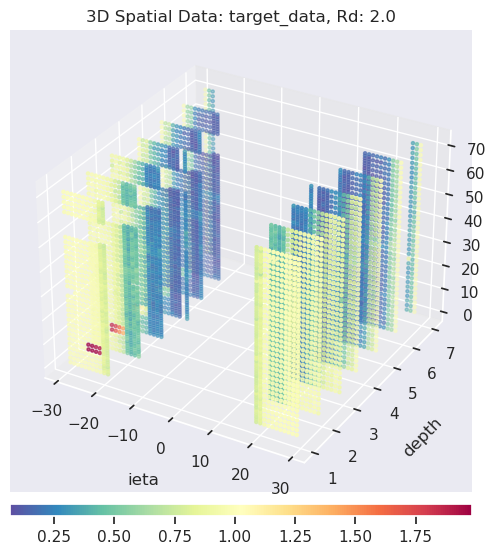

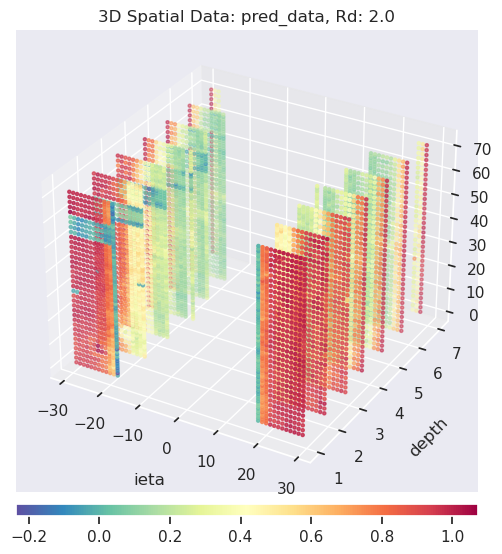

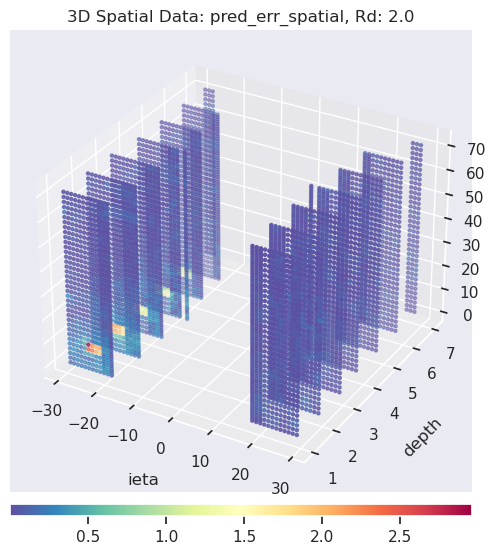

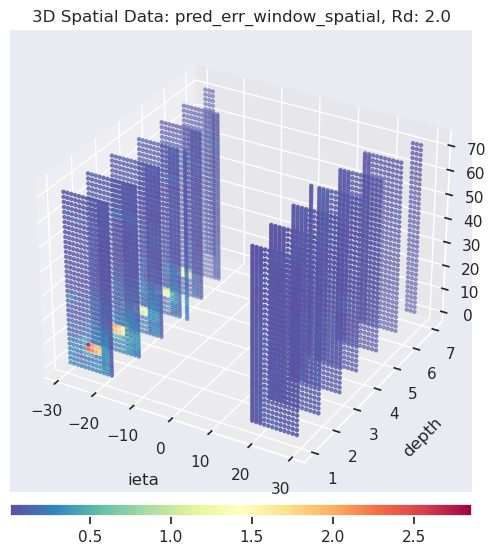

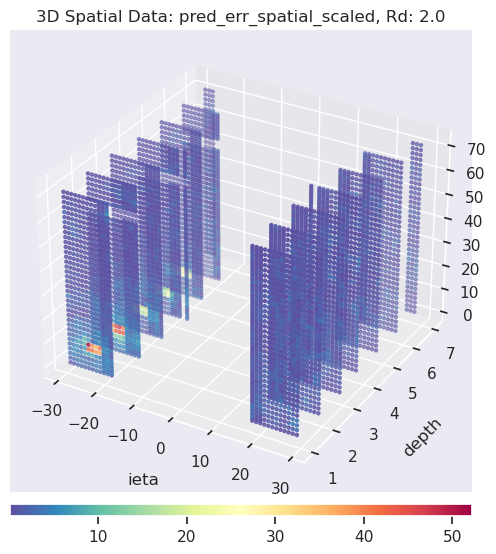

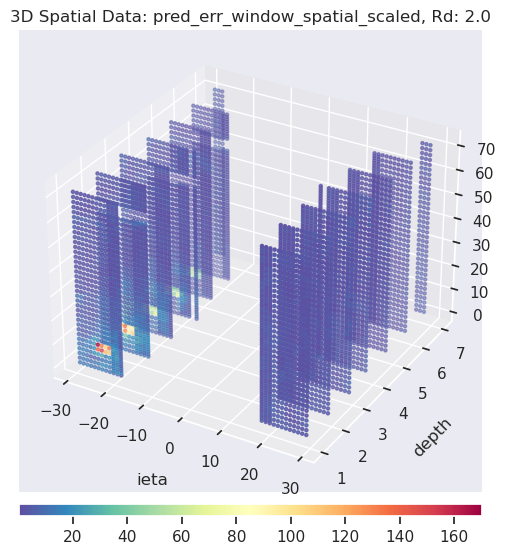

In [66]:
ls_sel = 0
for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}, tw: {}".format(anml_strength, sel_index, memorysize))
    
    for k,v in pred1_dict_anml_2018.items():
        util.plot_hist3d_heatmap(v[memorysize-1::memorysize][sel_index][ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
                            axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                            axes_labels=["ieta", "depth", "iphi"],
                            figsize=(6, 6), 
                            mask="positive", 
                            # mask=~subdetector_mask.transpose((0, 2, 1)), 
                            title=f"3D Spatial Data: {k}, Rd: {anml_strength}"
                        )
    break

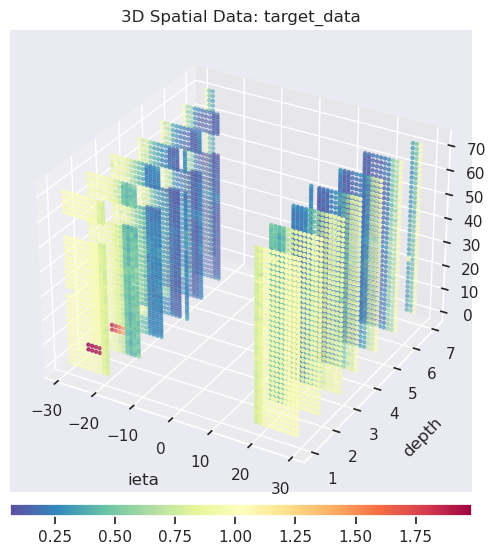

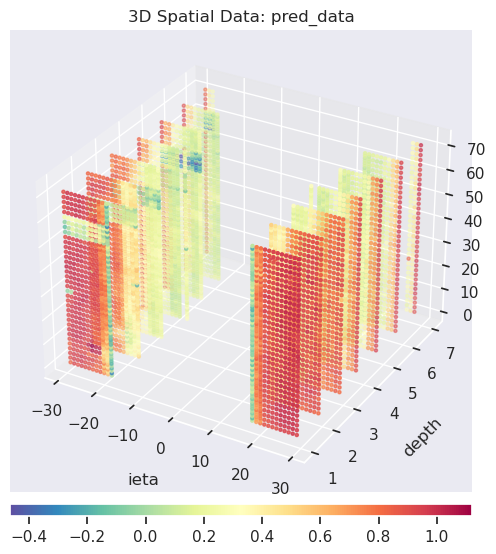

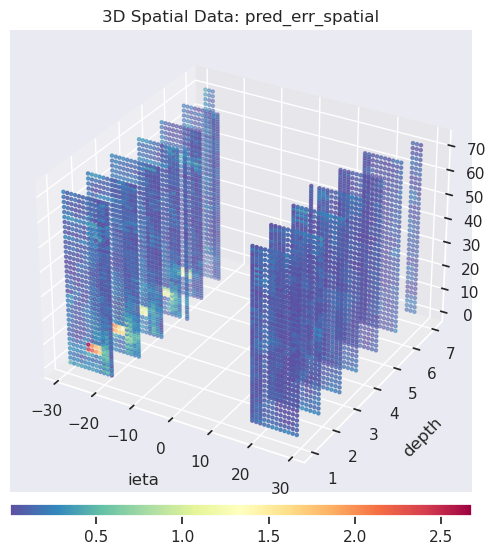

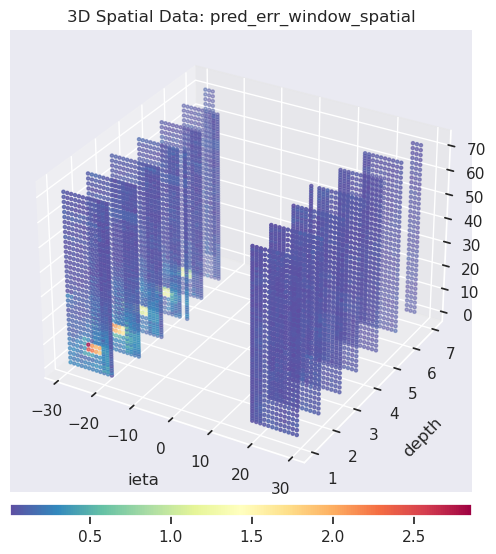

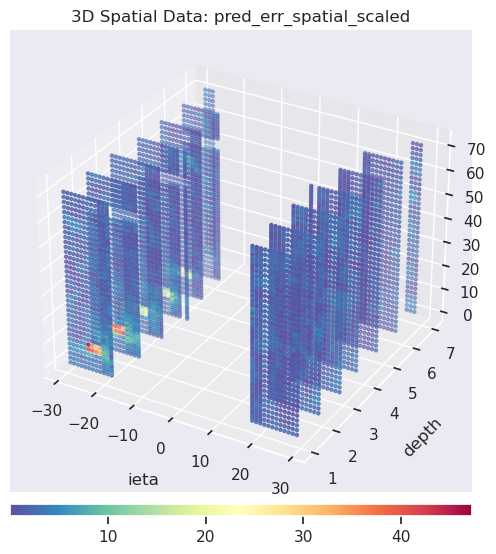

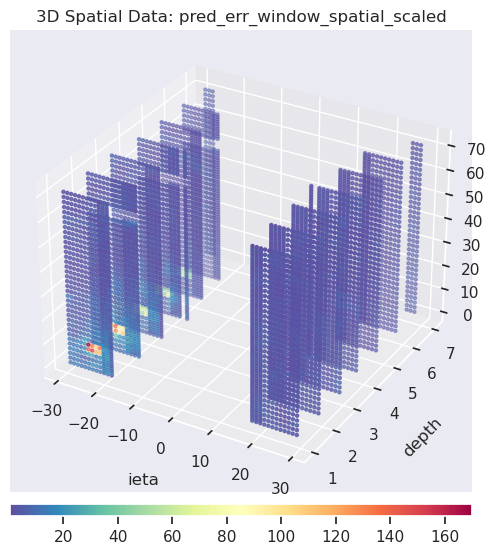

In [67]:
ls_sel = 0
for k,v in pred1_dict_anml_2018.items():
    util.plot_hist3d_heatmap(v[ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
                        axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                        axes_labels=["ieta", "depth", "iphi"],
                        figsize=(6, 6), 
                        mask="positive", 
                        # mask=~subdetector_mask.transpose((0, 2, 1)), 
                        title=f"3D Spatial Data: {k}"
                    )

In [68]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model1_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred1_dict_anml_2018["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model1_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model1_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred1_dict_anml_2018, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model1_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model1_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_prec_: 40.23969650268555
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[66781    10]
 [   25   464]]
        score
auc  0.974363
FPR  0.000150
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_prec_: 1.6851744651794434
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[ 8022 58769]
 [   25   464]]
        score
auc  0.534491
FPR  0.879894
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_p

### Model 2

In [69]:
# load training rec loss for per channel pred error normalization
ae2_pred_err_spatial_hist_train = pd.read_csv(f"{model2_dirpath_2018}/ae_pred_err_spatial_hist.csv", index_col=0)
ae2_pred_err_spatial_hist_train.shape
ae2_pred_err_spatial_hist_train.head()
ae2_pred_err_window_spatial_hist_train = pd.read_csv(f"{model2_dirpath_2018}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae2_pred_err_window_spatial_hist_train.shape
ae2_pred_err_window_spatial_hist_train.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [70]:
# estimate error scaling or normalizing values
admodel2_2018.pred_err_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae2_pred_err_spatial_hist_train["mean"].values), 
                                                    std_err_train=torch.Tensor(ae2_pred_err_spatial_hist_train["std"].values), reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

admodel2_2018.pred_err_window_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae2_pred_err_window_spatial_hist_train["mean"].values), 
                                                            std_err_train=torch.Tensor(ae2_pred_err_window_spatial_hist_train["std"].values), 
                                                            reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

In [71]:
admodel2_2018.pred_err_spatial_scaler.mean_err_train.shape
admodel2_2018.pred_err_spatial_scaler.mean_err_train.nansum()
admodel2_2018.pred_err_spatial_scaler.std_err_train.shape
admodel2_2018.pred_err_spatial_scaler.std_err_train.nansum()

torch.Size([1, 64, 72, 7, 1])

tensor(333.8679)

torch.Size([1, 64, 72, 7, 1])

tensor(248.0323)

In [72]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel2_2018.forced_reset_state() 
with torch.no_grad():
    pred2_dict_anml_2018 = admodel2_2018.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel2_2018.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred2_dict_anml_2018.items():
    pred2_dict_anml_2018[key] = torch.Tensor(value)
    print(f"{key}: {pred2_dict_anml_2018[key].shape}")

# pred error normalization 
err2_norm_ignore_mean = True
pred2_dict_anml_2018["pred_err_spatial_scaled"] = admodel2_2018.pred_err_spatial_scaler.transform(pred2_dict_anml_2018["pred_err_spatial"], ignore_mean=err2_norm_ignore_mean)
pred2_dict_anml_2018["pred_err_window_spatial_scaled"] = admodel2_2018.pred_err_window_spatial_scaler.transform(pred2_dict_anml_2018["pred_err_window_spatial"], ignore_mean=err2_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 5 False True
generating time series slices...
timewindow_size: 5
(60, 5, 64, 72, 7, 1)
sliding timewindow size: 5 
input shape:(300, 64, 72, 7, 1), output shape: (60, 5, 64, 72, 7, 1)
after slicing sizes:
(60, 5, 64, 72, 7, 1)
prepared sliced data: torch.Size([60, 5, 64, 72, 7, 1])
samples size:  torch.Size([60, 5, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([60, 5, 64, 72, 7, 1]) !
############################################################
torch.Size([60, 5, 64, 72, 7, 1]) torch.Size([60, 5, 64, 72, 7, 1])
model prediction...


100%|████████████████████████████████████████████████████████████████████████████| 60/60 [00:03<00:00, 18.94it/s]


done!
input_data.shape:  torch.Size([60, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([60, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([60, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output sha

In [73]:
for k,v in pred2_dict_anml_2018.items():
    k, v.shape

('target_data', torch.Size([300, 64, 72, 7, 1]))

('pred_data', torch.Size([300, 64, 72, 7, 1]))

('pred_err_spatial', torch.Size([300, 64, 72, 7, 1]))

('pred_err_window_spatial', torch.Size([300, 64, 72, 7, 1]))

('pred_err_spatial_scaled', torch.Size([300, 64, 72, 7, 1]))

('pred_err_window_spatial_scaled', torch.Size([300, 64, 72, 7, 1]))

anml_strength: 2.0, sel_index: slice(0, 10, None), tw: 5


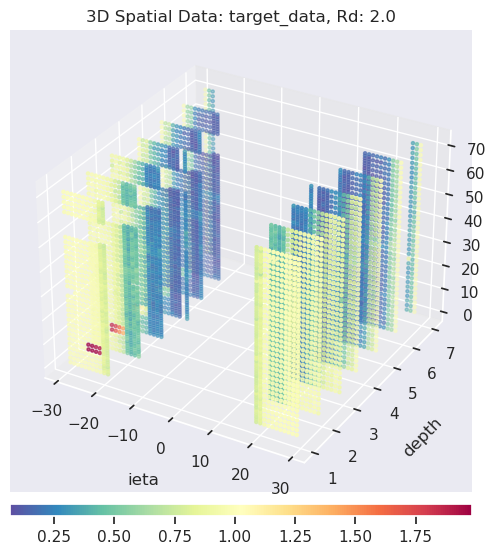

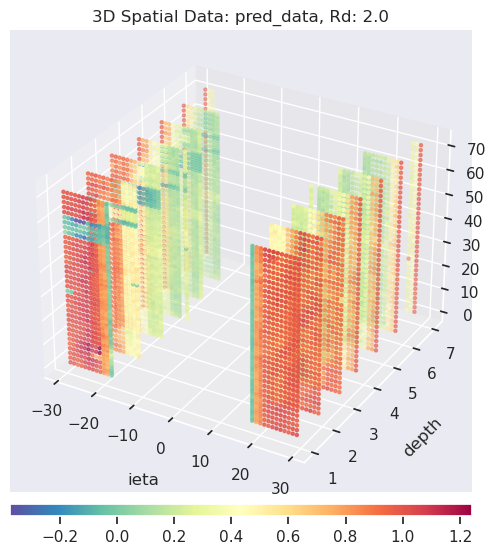

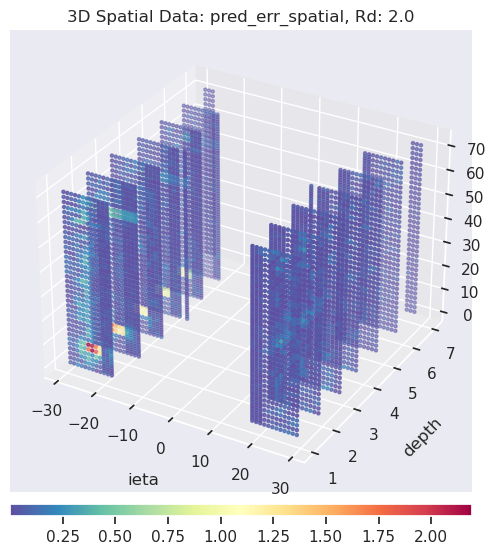

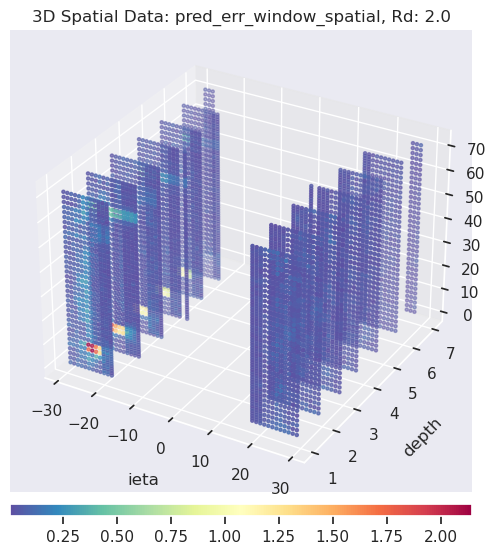

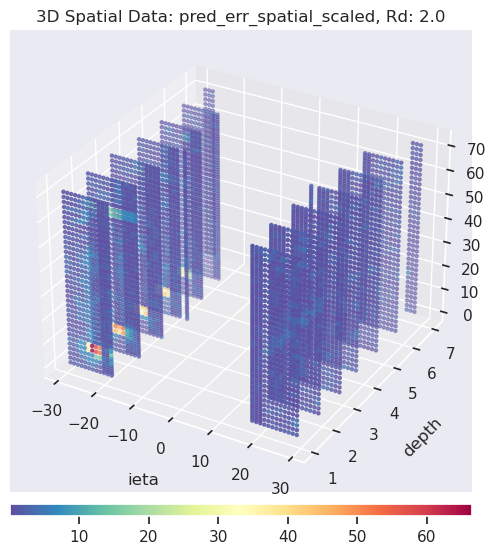

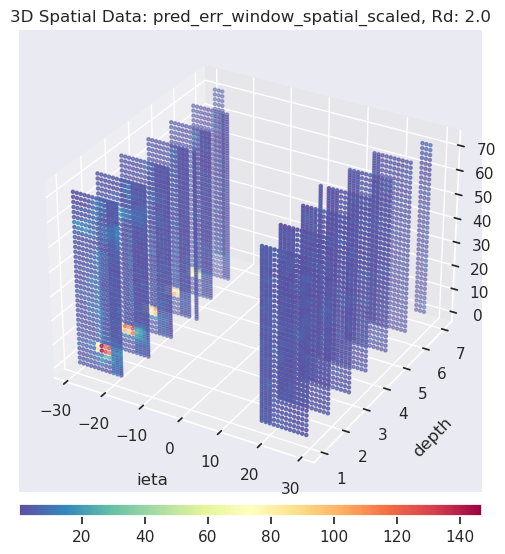

In [74]:
ls_sel = 0
for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}, tw: {}".format(anml_strength, sel_index, memorysize))
    
    for k,v in pred2_dict_anml_2018.items():
        util.plot_hist3d_heatmap(v[memorysize-1::memorysize][sel_index][ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
                            axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                            axes_labels=["ieta", "depth", "iphi"],
                            figsize=(6, 6), 
                            mask="positive", 
                            # mask=~subdetector_mask.transpose((0, 2, 1)), 
                            title=f"3D Spatial Data: {k}, Rd: {anml_strength}"
                        )
    break

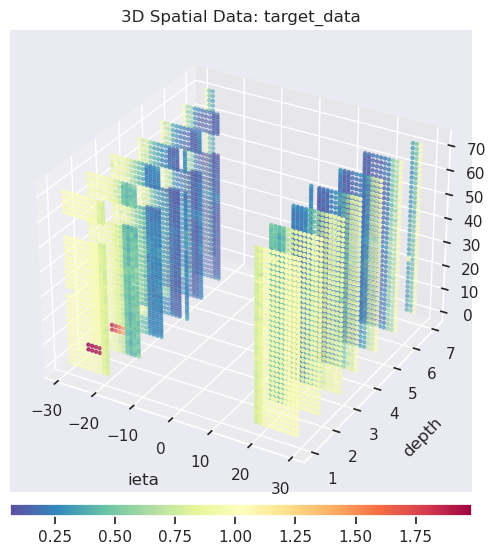

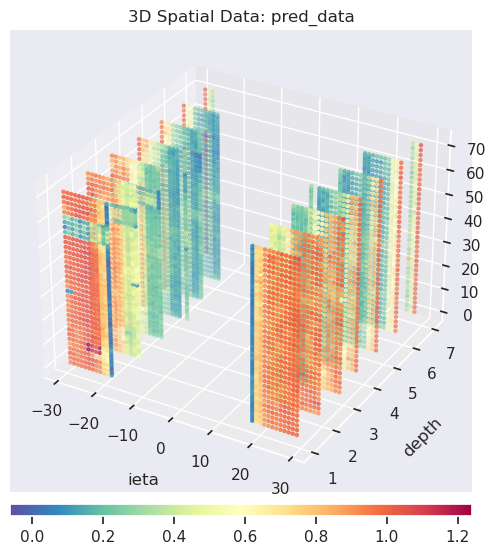

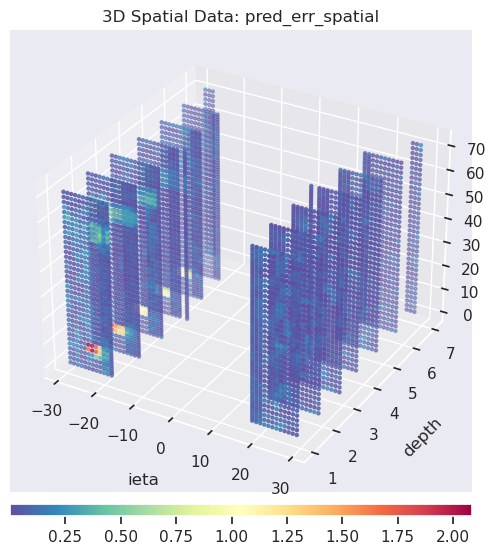

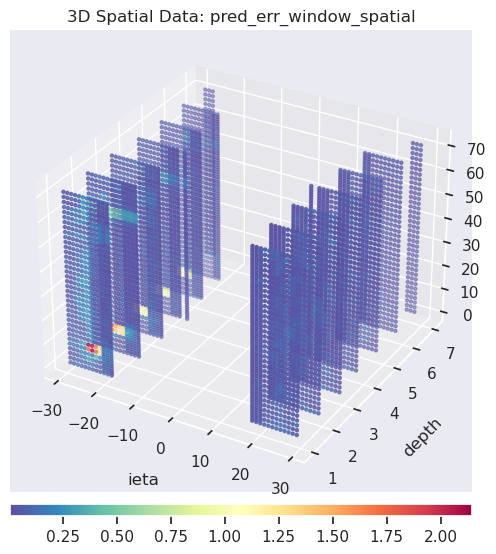

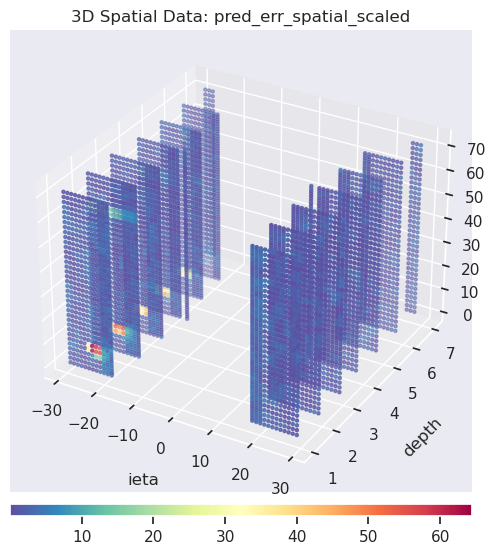

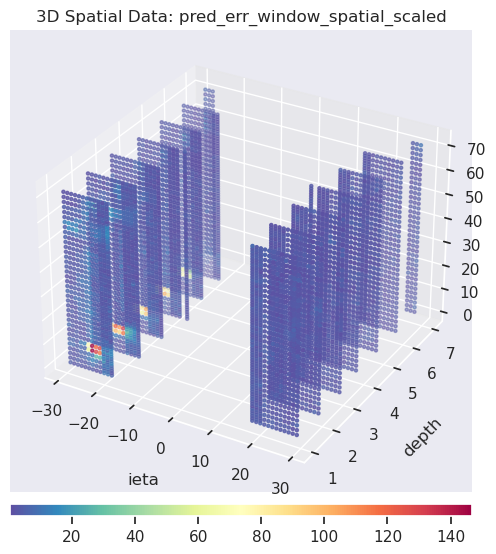

In [75]:
ls_sel = 0
for k,v in pred2_dict_anml_2018.items():
    util.plot_hist3d_heatmap(v[ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
                        axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                        axes_labels=["ieta", "depth", "iphi"],
                        figsize=(6, 6), 
                        mask="positive", 
                        # mask=~subdetector_mask.transpose((0, 2, 1)), 
                        title=f"3D Spatial Data: {k}"
                    )


In [76]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model2_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred2_dict_anml_2018["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model2_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model2_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred2_dict_anml_2018, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model2_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model2_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_prec_: 50.50953674316406
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[66791     0]
 [   25   464]]
        score
auc  0.974438
FPR  0.000000
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_prec_: 4.235207557678223
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[55102 11689]
 [   25   464]]
        score
auc  0.886933
FPR  0.175009
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_pr

### Model 3 (DepthViT)

In [77]:
# load training rec loss for per channel pred error normalization
ae3_pred_err_spatial_hist_train = pd.read_csv(f"{model3_dirpath_2018}/ae_pred_err_spatial_hist.csv", index_col=0)
ae3_pred_err_spatial_hist_train.shape
ae3_pred_err_spatial_hist_train.head()
ae3_pred_err_window_spatial_hist_train = pd.read_csv(f"{model3_dirpath_2018}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae3_pred_err_window_spatial_hist_train.shape
ae3_pred_err_window_spatial_hist_train.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [78]:
# estimate error scaling or normalizing values
admodel3_2018.pred_err_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae3_pred_err_spatial_hist_train["mean"].values), 
                                                    std_err_train=torch.Tensor(ae3_pred_err_spatial_hist_train["std"].values), reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

admodel3_2018.pred_err_window_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae3_pred_err_window_spatial_hist_train["mean"].values), 
                                                            std_err_train=torch.Tensor(ae3_pred_err_window_spatial_hist_train["std"].values), 
                                                            reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

In [79]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel3_2018.forced_reset_state() 
with torch.no_grad():
    pred3_dict_anml_2018 = admodel3_2018.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel3_2018.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred3_dict_anml_2018.items():
    pred3_dict_anml_2018[key] = torch.Tensor(value)
    print(f"{key}: {pred3_dict_anml_2018[key].shape}")

# pred error normalization 
err3_norm_ignore_mean = True
pred3_dict_anml_2018["pred_err_spatial_scaled"] = admodel3_2018.pred_err_spatial_scaler.transform(pred3_dict_anml_2018["pred_err_spatial"], ignore_mean=err3_norm_ignore_mean)
pred3_dict_anml_2018["pred_err_window_spatial_scaled"] = admodel3_2018.pred_err_window_spatial_scaler.transform(pred3_dict_anml_2018["pred_err_window_spatial"], ignore_mean=err3_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 1 False True
generating time series slices...
timewindow_size: 1
(300, 1, 64, 72, 7, 1)
sliding timewindow size: 1 
input shape:(300, 64, 72, 7, 1), output shape: (300, 1, 64, 72, 7, 1)
after slicing sizes:
(300, 1, 64, 72, 7, 1)
prepared sliced data: torch.Size([300, 1, 64, 72, 7, 1])
samples size:  torch.Size([300, 1, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([300, 1, 64, 72, 7, 1]) !
############################################################
torch.Size([300, 1, 64, 72, 7, 1]) torch.Size([300, 1, 64, 72, 7, 1])
model predict

100%|██████████████████████████████████████████████████████████████████████████| 300/300 [00:10<00:00, 29.98it/s]


done!
input_data.shape:  torch.Size([300, 1, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([300, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([300, 1, 64, 72, 7, 1])
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), out

In [80]:
for k,v in pred3_dict_anml_2018.items():
    k, v.shape

('target_data', torch.Size([300, 64, 72, 7, 1]))

('pred_data', torch.Size([300, 64, 72, 7, 1]))

('pred_err_spatial', torch.Size([300, 64, 72, 7, 1]))

('pred_err_window_spatial', torch.Size([300, 64, 72, 7, 1]))

('pred_err_spatial_scaled', torch.Size([300, 64, 72, 7, 1]))

('pred_err_window_spatial_scaled', torch.Size([300, 64, 72, 7, 1]))

anml_strength: 2.0, sel_index: slice(0, 10, None), tw: 5


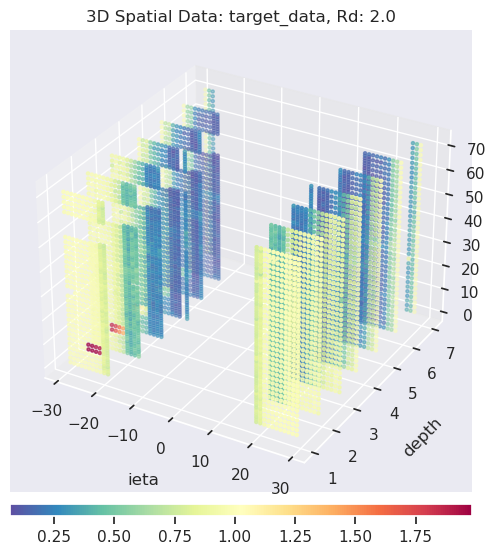

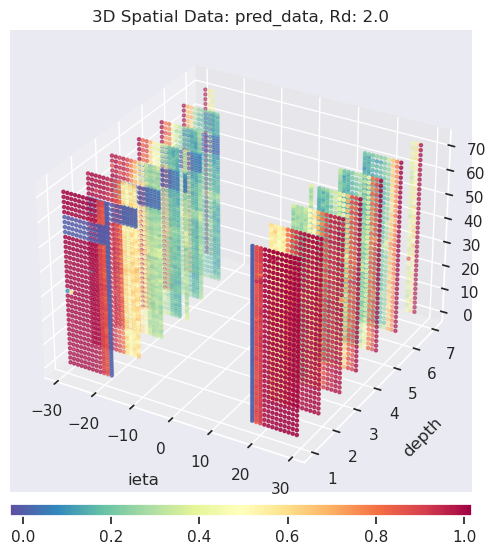

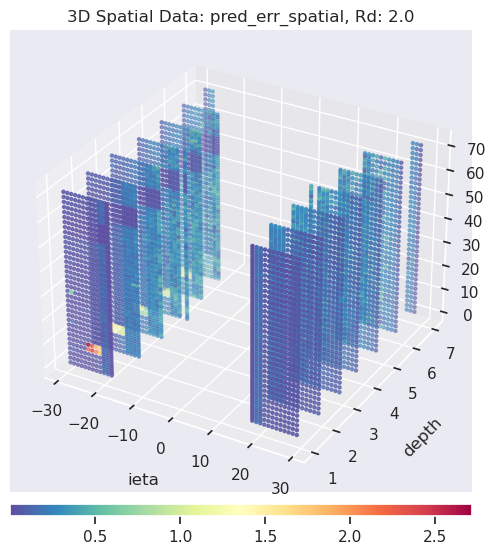

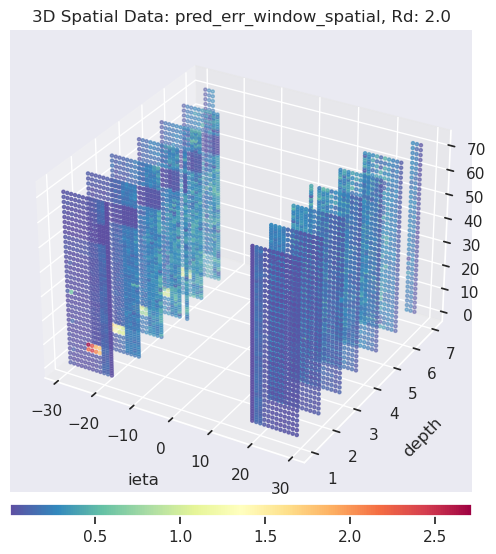

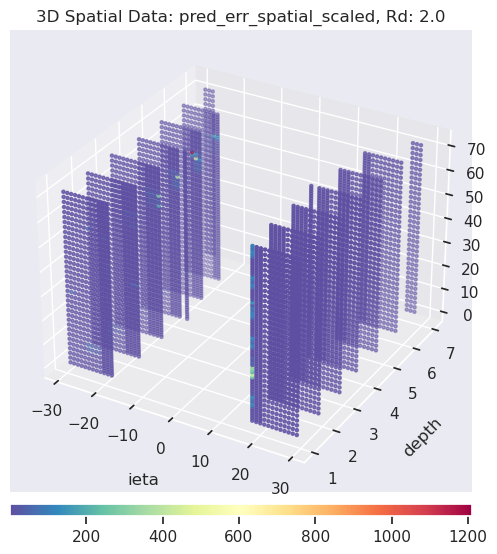

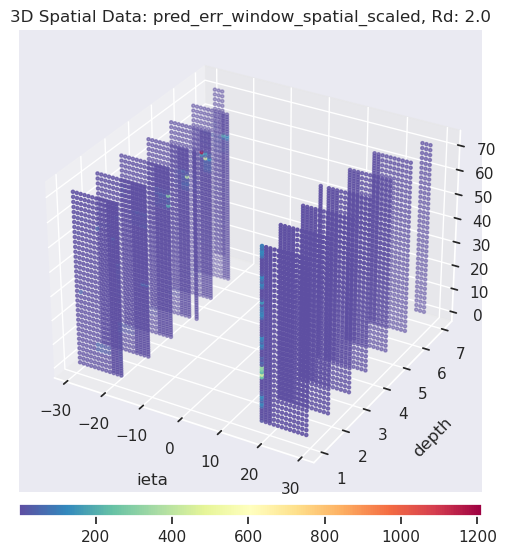

In [81]:
ls_sel = 0
for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}, tw: {}".format(anml_strength, sel_index, memorysize))
    
    for k,v in pred3_dict_anml_2018.items():
        util.plot_hist3d_heatmap(v[memorysize-1::memorysize][sel_index][ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
                            axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                            axes_labels=["ieta", "depth", "iphi"],
                            figsize=(6, 6), 
                            mask="positive", 
                            # mask=~subdetector_mask.transpose((0, 2, 1)), 
                            title=f"3D Spatial Data: {k}, Rd: {anml_strength}"
                        )
    break

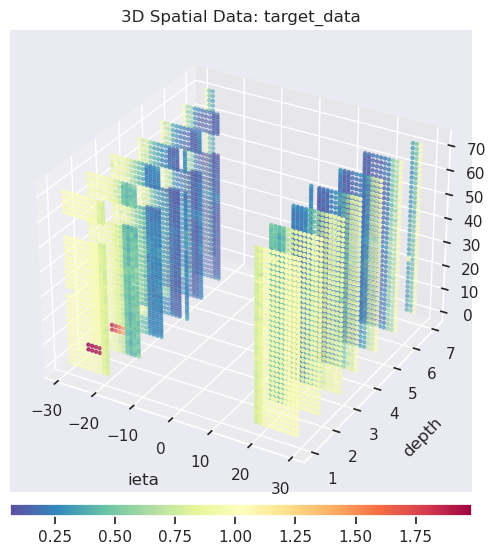

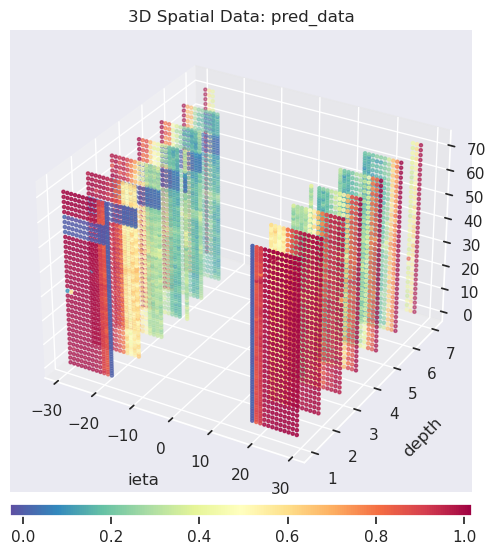

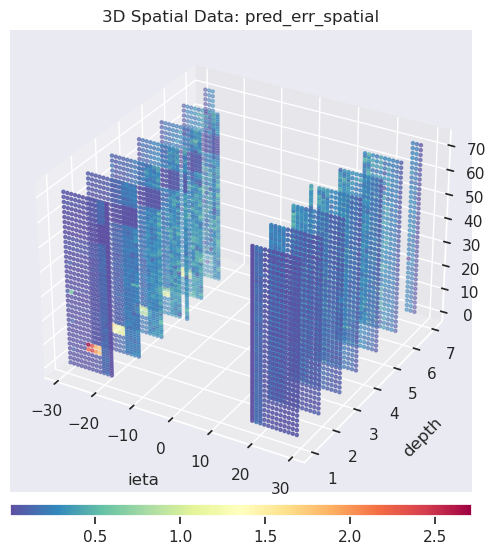

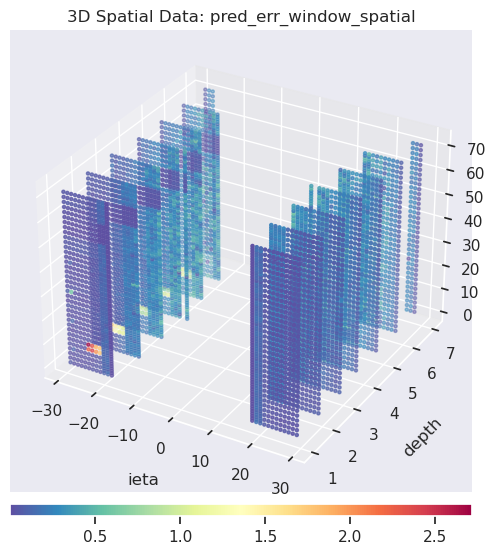

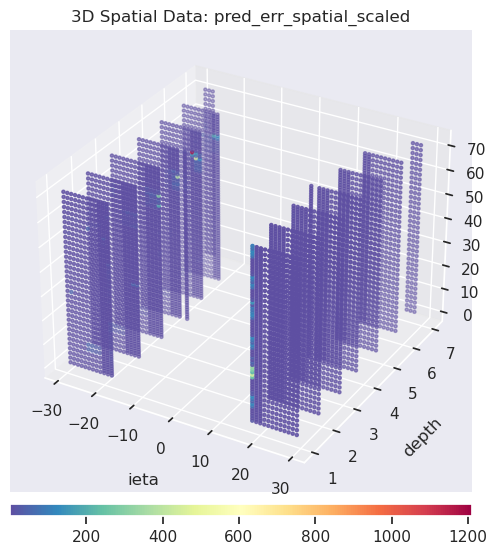

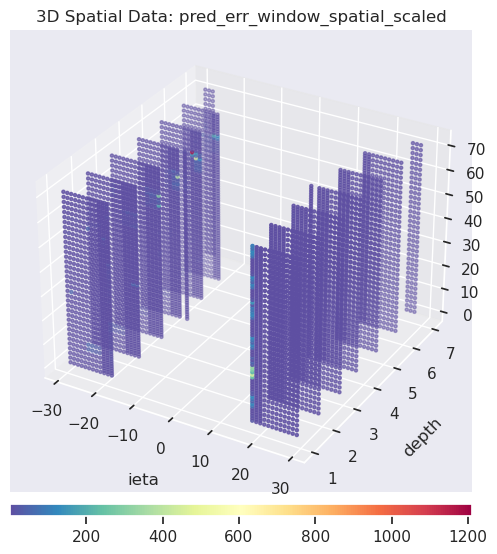

In [82]:
ls_sel = 0
for k,v in pred3_dict_anml_2018.items():
    util.plot_hist3d_heatmap(v[ls_sel,..., 0].permute((0, 2, 1)).cpu().detach().numpy(), 
                        axes_ticks=[hcal_digimap_3d_meta_template["xaxis"]["values"], hcal_digimap_3d_meta_template["zaxis"]["values"], hcal_digimap_3d_meta_template["yaxis"]["values"]],
                        axes_labels=["ieta", "depth", "iphi"],
                        figsize=(6, 6), 
                        mask="positive", 
                        # mask=~subdetector_mask.transpose((0, 2, 1)), 
                        title=f"3D Spatial Data: {k}"
                    )


In [83]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model3_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred3_dict_anml_2018["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model3_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model3_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred3_dict_anml_2018, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model3_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model3_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model3_ae_pred_err_spatial_aml_thr_prec_: 8.31761646270752
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[64850  1941]
 [   25   464]]
        score
auc  0.959907
FPR  0.029061
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model3_ae_pred_err_spatial_aml_thr_prec_: 2.8149170875549316
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[55696 11095]
 [   25   464]]
        score
auc  0.891380
FPR  0.166115
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model3_ae_pred_err_spatial_aml_thr_pr

In [85]:
gc.collect()
torch.cuda.empty_cache()

0

### Predict on 2022 data with synthetic anomaly

### Model 1

In [86]:
objAnmlLoad = SyntheticDQMChannelAnomalyLoader(test_np_filename_2022, anml_gen_size=anml_gen_size, dataset=dataset)

anml_gen_dict, anml_gen_config = objAnmlLoad.load_anml_gen_dict(anml_tag="{}".format(anml_tag))
anml_gen_config
anml_gen_dict
data_np_nd_with_healthy_tw, data_np_nd_healthy_label_tw = objAnmlLoad.load_health_ls_used_for_amnl_gen(anml_tag=anml_tag)
data_np_nd_with_healthy_tw.shape
data_np_nd_with_anml, data_np_nd_anml_label = objAnmlLoad.load_generated_anml(anml_tag="{}".format(anml_tag))
data_np_nd_with_anml_tw_multiple, data_np_nd_anml_label_tw_multiple = objAnmlLoad.load_generated_anml(anml_tag="tw_multiple_{}".format(anml_tag), anml_gen_size=anml_gen_size) # temporal for multiple Rd

data_np_nd_with_anml_tw_multiple.shape
data_np_nd_anml_label_tw_multiple.shape

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_anml_gen_dict_anomaly_channel_10.pkl
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_anml_kwargs_anomaly_channel_10.json


{'anml_gen_size': 10,
 'anml_strength': [2.0, 0.8, 0.6, 0.4, 0.2, 0.0],
 'anml_tag': 'anomaly_channel',
 'dataset': 'HE',
 'issave': True,
 'memorysize': 5,
 'seed': 101,
 'skip_init_ls': 5,
 'test_np_filename': 'he_test_dataset_2022/test_data'}

{'ls_rand': array([ 868, 1552, 1366, 1604,  604, 2050,   80,  978, 1581, 1673]),
 'seed': 101,
 'loc': {0: {'ls': 868,
   'anml_range_idx': (0,
    slice(8, 12, None),
    slice(7, 11, None),
    slice(0, 5, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  1: {'ls': 1552,
   'anml_range_idx': (1,
    slice(9, 11, None),
    slice(12, 18, None),
    slice(0, 4, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  2: {'ls': 1366,
   'anml_range_idx': (2,
    slice(48, 51, None),
    slice(30, 36, None),
    slice(2, 4, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  3: {'ls': 1604,
   'anml_range_idx': (3,
    slice(4, 10, None),
    slice(21, 24, None),
    slice(3, 7, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  4: {'ls': 604,
   'anml_range_idx': (4,
    slice(9, 13, None),
    slice(47, 50, None),
    slice(0, 5, None),
    0),
   'anml_strength': array

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_with_healthy_tw_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_healthy_label_tw_anomaly_channel_10.npy
(10, 5, 64, 72, 7, 1) (10, 5, 64, 72, 7, 1)


torch.Size([10, 5, 64, 72, 7, 1])

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_with_anml_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_anml_label_anomaly_channel_10.npy
(10, 64, 72, 7, 1) (10, 64, 72, 7, 1)
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_with_anml_tw_multiple_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_anml_label_tw_multiple_anomaly_channel_10.npy
(60, 5, 64, 72, 7, 1) (60, 5, 64, 72, 7, 1)


torch.Size([60, 5, 64, 72, 7, 1])

torch.Size([60, 5, 64, 72, 7, 1])

In [87]:
anml_gen_config
anml_strength_list = anml_gen_config["anml_strength"] 
anml_tag = anml_gen_config["anml_tag"]

{'anml_gen_size': 10,
 'anml_strength': [2.0, 0.8, 0.6, 0.4, 0.2, 0.0],
 'anml_tag': 'anomaly_channel',
 'dataset': 'HE',
 'issave': True,
 'memorysize': 5,
 'seed': 101,
 'skip_init_ls': 5,
 'test_np_filename': 'he_test_dataset_2022/test_data'}

In [88]:
data_np_nd_with_anml.shape # digi with the generated unique anomalies at unique LS
data_np_nd_anml_label.shape
data_np_nd_anml_label.sum() # number of generated unique anomalies at unique LS

torch.Size([10, 64, 72, 7, 1])

torch.Size([10, 64, 72, 7, 1])

tensor(507)

In [89]:
# load model first
num_aml_per_stength = anml_gen_config["anml_gen_size"] 
memorysize = anml_gen_config["memorysize"]

In [90]:
# load training rec loss for per channel pred error normalization
ae1_pred_err_spatial_hist_train_2022 = pd.read_csv(f"{model1_dirpath_2018}/ae_pred_err_spatial_hist.csv", index_col=0)
ae1_pred_err_spatial_hist_train_2022.shape
ae1_pred_err_spatial_hist_train_2022.head()
ae1_pred_err_window_spatial_hist_train_2022 = pd.read_csv(f"{model1_dirpath_2018}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae1_pred_err_window_spatial_hist_train_2022.shape
ae1_pred_err_window_spatial_hist_train_2022.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [91]:
# estimate error scaling or normalizing values
admodel1_2018.pred_err_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae1_pred_err_spatial_hist_train_2022["mean"].values), 
                                                    std_err_train=torch.Tensor(ae1_pred_err_spatial_hist_train_2022["std"].values), reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

admodel1_2018.pred_err_window_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae1_pred_err_window_spatial_hist_train_2022["mean"].values), 
                                                            std_err_train=torch.Tensor(ae1_pred_err_window_spatial_hist_train_2022["std"].values), 
                                                            reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

In [92]:
admodel1_2018.pred_err_spatial_scaler.mean_err_train.shape
admodel1_2018.pred_err_spatial_scaler.mean_err_train.nansum()
admodel1_2018.pred_err_spatial_scaler.std_err_train.shape
admodel1_2018.pred_err_spatial_scaler.std_err_train.nansum()

torch.Size([1, 64, 72, 7, 1])

tensor(425.2094)

torch.Size([1, 64, 72, 7, 1])

tensor(375.9204)

In [93]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel1_2018.forced_reset_state()
with torch.no_grad():
    pred1_dict_anml_2022 = admodel1_2018.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel1_2018.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred1_dict_anml_2022.items():
    pred1_dict_anml_2022[key] = torch.Tensor(value)
    print(f"{key}: {pred1_dict_anml_2022[key].shape}")

# pred error normalization 
err1_norm_ignore_mean = True
pred1_dict_anml_2022["pred_err_spatial_scaled"] = admodel1_2018.pred_err_spatial_scaler.transform(pred1_dict_anml_2022["pred_err_spatial"], ignore_mean=err1_norm_ignore_mean)
pred1_dict_anml_2022["pred_err_window_spatial_scaled"] = admodel1_2018.pred_err_window_spatial_scaler.transform(pred1_dict_anml_2022["pred_err_window_spatial"], ignore_mean=err1_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 5 False True
generating time series slices...
timewindow_size: 5
(60, 5, 64, 72, 7, 1)
sliding timewindow size: 5 
input shape:(300, 64, 72, 7, 1), output shape: (60, 5, 64, 72, 7, 1)
after slicing sizes:
(60, 5, 64, 72, 7, 1)
prepared sliced data: torch.Size([60, 5, 64, 72, 7, 1])
samples size:  torch.Size([60, 5, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([60, 5, 64, 72, 7, 1]) !
############################################################
torch.Size([60, 5, 64, 72, 7, 1]) torch.Size([60, 5, 64, 72, 7, 1])
model prediction...


100%|███████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 101.45it/s]


done!
input_data.shape:  torch.Size([60, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([60, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([60, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output sha

In [94]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model1_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred1_dict_anml_2022["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model1_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model1_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred1_dict_anml_2022, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model1_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model1_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_prec_: 4.985195159912109
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[18462 48329]
 [   25   464]]
        score
auc  0.612645
FPR  0.723586
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_prec_: 2.23127818107605
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[ 4483 62308]
 [   25   464]]
        score
auc  0.507998
FPR  0.932880
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_pre

### Model 2

In [95]:
# load training rec loss for per channel pred error normalization
ae2_pred_err_spatial_hist_train_2022 = pd.read_csv(f"{model2_dirpath_2018}/ae_pred_err_spatial_hist.csv", index_col=0)
ae2_pred_err_spatial_hist_train_2022.shape
ae2_pred_err_spatial_hist_train_2022.head()
ae2_pred_err_window_spatial_hist_train_2022 = pd.read_csv(f"{model2_dirpath_2018}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae2_pred_err_window_spatial_hist_train_2022.shape
ae2_pred_err_window_spatial_hist_train_2022.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [96]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel2_2018.forced_reset_state() 
with torch.no_grad():
    pred2_dict_anml_2022 = admodel2_2018.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel2_2018.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred2_dict_anml_2022.items():
    pred2_dict_anml_2022[key] = torch.Tensor(value)
    print(f"{key}: {pred2_dict_anml_2022[key].shape}")

# pred error normalization 
err2_norm_ignore_mean = True
pred2_dict_anml_2022["pred_err_spatial_scaled"] = admodel2_2018.pred_err_spatial_scaler.transform(pred2_dict_anml_2022["pred_err_spatial"], ignore_mean=err2_norm_ignore_mean)
pred2_dict_anml_2022["pred_err_window_spatial_scaled"] = admodel2_2018.pred_err_window_spatial_scaler.transform(pred2_dict_anml_2022["pred_err_window_spatial"], ignore_mean=err2_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 5 False True
generating time series slices...
timewindow_size: 5
(60, 5, 64, 72, 7, 1)
sliding timewindow size: 5 
input shape:(300, 64, 72, 7, 1), output shape: (60, 5, 64, 72, 7, 1)
after slicing sizes:
(60, 5, 64, 72, 7, 1)
prepared sliced data: torch.Size([60, 5, 64, 72, 7, 1])
samples size:  torch.Size([60, 5, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([60, 5, 64, 72, 7, 1]) !
############################################################
torch.Size([60, 5, 64, 72, 7, 1]) torch.Size([60, 5, 64, 72, 7, 1])
model prediction...


100%|████████████████████████████████████████████████████████████████████████████| 60/60 [00:03<00:00, 18.81it/s]


done!
input_data.shape:  torch.Size([60, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([60, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([60, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output sha

In [97]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model2_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred2_dict_anml_2022["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model2_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model2_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred2_dict_anml_2022, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model2_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model2_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_prec_: 7.64348030090332
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[33363 33428]
 [   25   464]]
        score
auc  0.724194
FPR  0.500487
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_prec_: 1.782511591911316
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[ 3902 62889]
 [   25   464]]
        score
auc  0.503648
FPR  0.941579
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_pre

### Model 3

In [98]:
# load training rec loss for per channel pred error normalization
ae3_pred_err_spatial_hist_train_2022 = pd.read_csv(f"{model3_dirpath_2018}/ae_pred_err_spatial_hist.csv", index_col=0)
ae3_pred_err_spatial_hist_train_2022.shape
ae3_pred_err_spatial_hist_train_2022.head()
ae3_pred_err_window_spatial_hist_train_2022 = pd.read_csv(f"{model3_dirpath_2018}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae3_pred_err_window_spatial_hist_train_2022.shape
ae3_pred_err_window_spatial_hist_train_2022.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [99]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel3_2018.forced_reset_state() 
with torch.no_grad():
    pred3_dict_anml_2022 = admodel3_2018.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel2_2018.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred3_dict_anml_2022.items():
    pred3_dict_anml_2022[key] = torch.Tensor(value)
    print(f"{key}: {pred3_dict_anml_2022[key].shape}")

# pred error normalization 
err3_norm_ignore_mean = True
pred3_dict_anml_2022["pred_err_spatial_scaled"] = admodel3_2018.pred_err_spatial_scaler.transform(pred3_dict_anml_2022["pred_err_spatial"], ignore_mean=err3_norm_ignore_mean)
pred3_dict_anml_2022["pred_err_window_spatial_scaled"] = admodel3_2018.pred_err_window_spatial_scaler.transform(pred3_dict_anml_2022["pred_err_window_spatial"], ignore_mean=err3_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 1 False True
generating time series slices...
timewindow_size: 1
(300, 1, 64, 72, 7, 1)
sliding timewindow size: 1 
input shape:(300, 64, 72, 7, 1), output shape: (300, 1, 64, 72, 7, 1)
after slicing sizes:
(300, 1, 64, 72, 7, 1)
prepared sliced data: torch.Size([300, 1, 64, 72, 7, 1])
samples size:  torch.Size([300, 1, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([300, 1, 64, 72, 7, 1]) !
############################################################
torch.Size([300, 1, 64, 72, 7, 1]) torch.Size([300, 1, 64, 72, 7, 1])
model predict

100%|██████████████████████████████████████████████████████████████████████████| 300/300 [00:10<00:00, 28.60it/s]


done!
input_data.shape:  torch.Size([300, 1, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([300, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([300, 1, 64, 72, 7, 1])
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), out

In [100]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model3_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred3_dict_anml_2022["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model2_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model3_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred3_dict_anml_2022, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model3_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model3_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_prec_: 1.174972653388977
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[17156 49635]
 [   25   464]]
        score
auc  0.602868
FPR  0.743139
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_prec_: 2.345935583114624
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[24432 42359]
 [   25   464]]
        score
auc  0.657337
FPR  0.634202
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_pr

# Now Train model on 2022 data and predict on 2018 data

### Model 1 (CNN(1d/2d/3d)+RNN+VAE)

In [101]:
# load model trainer
from models_spatial import *
from model_trainer import *

In [102]:
model1_kwargs = {
        "model_alg": "CNNRNNAE_MultiDim_SPATIAL",
        "dataset": "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HE",
        "train_data_filename": "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_ts",
        "data_dirpath": data_path,   
        "e_num_conv_layers": 4,
        "latent_dim": 32,  # [2, 4, 8, 16, 32] increase this to improve accuracy and reduce to speed up training
        "rnn_model": "lstm",
        "isvariational": True,
        "reg_beta": 0.001,
        "shuffle": True,
        "isplot": False,
        "num_epochs": 250,
        "early_stop_epoch": 10,
        "verbose": 1,
        "learning_rate": 0.001,
        "weight_decay": 1e-7,
        "batch_size": 8,
        "train_size_perc": 1.00,
        "optimizer": "adam"
    }

ad_model_generator(**model1_kwargs)

{}
loading train_data: HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_ts...
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_ts.pkl
feature_dim: torch.Size([520, 5, 64, 72, 7, 1]) target_dim: torch.Size([520, 5, 64, 72, 7, 1])
{'dataset_name': 'HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE', 'source_files': None, 'datatype': 'ts', 'timewindow_size': 5, 'istrain': True, 'input_scaling_alg': 'minmax', 'input_scaler': MinMaxScaler(), 'isdata_scaled': True, 'mask': array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  Tr

### Model 2 (CNN(1d/2d/3d)+GNN+RNN+VAE)

In [103]:
#    CNN(1d/2d/3d)+GNN+RNN+VAE

model2_kwargs = {
        "model_alg": "CNNGNNRNNAE_MultiDim_SPATIAL",
        "dataset": "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HE",
        "train_data_filename": "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_ts",
        "data_dirpath": data_path,   
        "e_num_conv_layers": 4,
        "latent_dim": 32,  # [2, 4, 8, 16, 32] increase this to improve accuracy and reduce to speed up training
        "rnn_model": "lstm",
        "isvariational": True,
        "reg_beta": 0.001,
        "shuffle": True,
        "isplot": False,
        "num_epochs": 250,
        "early_stop_epoch": 20,
        "verbose": 1,
        "learning_rate": 0.01, #Here, learning rate should be set to 0.01
        "weight_decay": 1e-7,
        "batch_size": 8,
        "train_size_perc": 1.00,
        "optimizer": "adam",
        "use_graphstad_optimizer": True,
        "node_edge_index_filename": rf"{data_path}/HCAL_CONFIG/he_graph_edge_array_indices_depth.npy",
    }
ad_model_generator(**model2_kwargs)

{}
loading train_data: HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_ts...
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_ts.pkl
feature_dim: torch.Size([520, 5, 64, 72, 7, 1]) target_dim: torch.Size([520, 5, 64, 72, 7, 1])
{'dataset_name': 'HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE', 'source_files': None, 'datatype': 'ts', 'timewindow_size': 5, 'istrain': True, 'input_scaling_alg': 'minmax', 'input_scaler': MinMaxScaler(), 'isdata_scaled': True, 'mask': array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  Tr

### Model 3 (DepthViT)

In [12]:
model3_kwargs = {
        "model_alg": "DepthwiseCrossViTAE_MultiDim_SPATIAL",
        "dataset": "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HE",
        "train_data_filename": "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_iid",
        "data_dirpath": data_path,   
        "e_num_conv_layers": 4,
        "latent_dim": 56,  # [2, 4, 8, 16, 32] increase this to improve accuracy and reduce to speed up training
        "rnn_model": "lstm",
        "isvariational": True,
        "reg_beta": 0.001,
        "shuffle": True,
        "isplot": False,
        "num_epochs": 250,
        "early_stop_epoch": 20,
        "verbose": 1,
        "learning_rate": 0.001,
        "weight_decay": 1e-7,
        "batch_size": 8,
        "train_size_perc": 1.00,
        "optimizer": "adam",
        "patch_size": 12,
        "k_factor": 8,
        "num_layers": 5,
        "mlp_dim": 56,
        "dropout": 0.1,
        "attention_dropout": 0.1,
        "mask_ratio": 0.5,
        "image_size": [64,72],  # Default image size
    }

ad_model_generator(**model3_kwargs)

{}
loading train_data: HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_iid...
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_train_dataset_iid.pkl
feature_dim: torch.Size([2600, 1, 64, 72, 7, 1]) target_dim: torch.Size([2600, 1, 64, 72, 7, 1])
{'dataset_name': 'HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE', 'source_files': None, 'datatype': 'ts', 'timewindow_size': 1, 'istrain': True, 'input_scaling_alg': 'minmax', 'input_scaler': MinMaxScaler(), 'isdata_scaled': True, 'mask': array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,

In [13]:
gc.collect()
torch.cuda.empty_cache()

3670

### Load Model

### Model 1

In [14]:
# this model is not fully-trained and used only to demonstrate how to make model prediction and result analysis
model1_dirpath_2022 = rf"{result_path}/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE/model/he_m_5_is_minmax_ns_1/CNNRNNAE_MultiDim_SPATIAL_4452"
model1_filepath_2022 = rf"{model1_dirpath_2022}/AE_MODEL.pkl"
model1_dict_2022 = util.load_pickle(model1_filepath_2022)

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/results/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE/model/he_m_5_is_minmax_ns_1/CNNRNNAE_MultiDim_SPATIAL_4452/AE_MODEL.pkl


In [15]:
admodel1_2022 = model1_dict_2022["model"]
admodel1_2022.get_encoded = False
admodel1_2022.keep_hidden_states = False
admodel1_2022.model_data_format = False
admodel1_2022 = admodel1_2022.to(device)

### Model 2

In [16]:
# this model is not fully-trained and used only to demonstrate how to make model prediction and result analysis
model2_dirpath_2022 = rf"{result_path}/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE/model/he_m_5_is_minmax_ns_1/GraphSTAD_RIN_DC__CNNGNNRNNAE_MultiDim_SPATIAL_4360"
model2_filepath_2022 = rf"{model2_dirpath_2022}/AE_MODEL.pkl"
model2_dict_2022 = util.load_pickle(model2_filepath_2022)

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/results/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE/model/he_m_5_is_minmax_ns_1/GraphSTAD_RIN_DC__CNNGNNRNNAE_MultiDim_SPATIAL_4360/AE_MODEL.pkl


In [17]:
admodel2_2022 = model2_dict_2022["model"]
admodel2_2022.get_encoded = False
admodel2_2022.keep_hidden_states = False
admodel2_2022.model_data_format = False
admodel2_2022 = admodel2_2022.to(device)

### Model 3

In [18]:
# this model is not fully-trained and used only to demonstrate how to make model prediction and result analysis
model3_dirpath_2022 = rf"{result_path}/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE/model/he_m_1_is_minmax_ns_1/DepthwiseCrossViTAE_MultiDim_SPATIAL_3505"
model3_filepath_2022 = rf"{model3_dirpath_2022}/AE_MODEL.pkl"
model3_dict_2022 = util.load_pickle(model3_filepath_2022)

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/results/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE/model/he_m_1_is_minmax_ns_1/DepthwiseCrossViTAE_MultiDim_SPATIAL_3505/AE_MODEL.pkl


In [19]:
admodel3_2022 = model3_dict_2022["model"]
admodel3_2022.get_encoded = False
admodel3_2022.keep_hidden_states = False
admodel3_2022.model_data_format = False
admodel3_2022 = admodel3_2022.to(device)

### Load Dataset

### Temporal

In [20]:
datatype="ts"
subdetector_name="he"
data_kwargs_2022 = dict(
                    subdetector_name = subdetector_name,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HE",
                    data_filename = "test_dataset_ts"
                    )

model_test_data_ts_2022 = util.load_pickle("{}/{}_{}_{}.pkl".format(data_path,
            data_kwargs_2022["dataset"].replace('/', '_'), data_kwargs_2022["subdetector_name"], data_kwargs_2022["data_filename"]))

model_test_data_ts_2022.shape
model_test_data_ts_2022.mask.shape
model_test_data_ts_2022.get_np()[0].shape

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_test_dataset_ts.pkl


<bound method DatasetTemplate.shape of <model_datasets.DatasetTemplate object at 0x2ab998e1ff40>>

(64, 72, 7)

(566, 5, 64, 72, 7, 1)

### Nontemporal

In [21]:
datatype="iid"
subdetector_name="he"
data_kwargs_2022 = dict(
                    subdetector_name = subdetector_name,
                    dataset = "HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc/HE",
                    data_filename = "test_dataset_iid"
                    )

model_test_data_iid_2022 = util.load_pickle("{}/{}_{}_{}.pkl".format(data_path,
            data_kwargs_2022["dataset"].replace('/', '_'), data_kwargs_2022["subdetector_name"], data_kwargs_2022["data_filename"]))

model_test_data_iid_2022.shape
model_test_data_iid_2022.mask.shape
model_test_data_iid_2022.get_np()[0].shape

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_ONLINE_DQM__ZeroBias__2022__cut20fc_HE_he_test_dataset_iid.pkl


<bound method DatasetTemplate.shape of <model_datasets.DatasetTemplate object at 0x2ab937bc9de0>>

(64, 72, 7)

(2830, 1, 64, 72, 7, 1)

##### Model Prediction (Data Reconstruction)

### Model 1

In [22]:
with torch.no_grad():
    pred1_dict_2022 = admodel1_2022.predict(model_test_data_ts_2022)
    pred1_dict_2022.keys()

torch.Size([566, 5, 64, 72, 7, 1]) torch.Size([566, 5, 64, 72, 7, 1])
model prediction...


100%|██████████████████████████████████████████████████████████████████████████| 566/566 [00:14<00:00, 38.12it/s]


done!
input_data.shape:  torch.Size([566, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([566, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(566, 5, 64, 72, 7, 1), output shape: (2830, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(566, 5, 64, 72, 7, 1), output shape: (2830, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(566, 5, 64, 72, 7, 1), output shape: (2830, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([566, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(566, 5, 64, 72, 7, 1), 

dict_keys(['target_data', 'pred_data', 'pred_err_spatial', 'pred_err_window_spatial'])

### Model 2

In [23]:
with torch.no_grad():
    pred2_dict_2022 = admodel2_2022.predict(model_test_data_ts_2022)
    pred2_dict_2022.keys()

torch.Size([566, 5, 64, 72, 7, 1]) torch.Size([566, 5, 64, 72, 7, 1])
model prediction...


100%|██████████████████████████████████████████████████████████████████████████| 566/566 [00:35<00:00, 15.92it/s]


done!
input_data.shape:  torch.Size([566, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([566, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(566, 5, 64, 72, 7, 1), output shape: (2830, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(566, 5, 64, 72, 7, 1), output shape: (2830, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(566, 5, 64, 72, 7, 1), output shape: (2830, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([566, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(566, 5, 64, 72, 7, 1), 

dict_keys(['target_data', 'pred_data', 'pred_err_spatial', 'pred_err_window_spatial'])

### Model 3

In [24]:
with torch.no_grad():
    pred3_dict_2022 = admodel3_2022.predict(model_test_data_iid_2022)
    pred3_dict_2022.keys()

torch.Size([2830, 1, 64, 72, 7, 1]) torch.Size([2830, 1, 64, 72, 7, 1])
model prediction...


100%|████████████████████████████████████████████████████████████████████████| 2830/2830 [01:30<00:00, 31.32it/s]


done!
input_data.shape:  torch.Size([2830, 1, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([2830, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(2830, 1, 64, 72, 7, 1), output shape: (2830, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(2830, 1, 64, 72, 7, 1), output shape: (2830, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(2830, 1, 64, 72, 7, 1), output shape: (2830, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([2830, 1, 64, 72, 7, 1])
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(2830, 1, 64, 72, 

dict_keys(['target_data', 'pred_data', 'pred_err_spatial', 'pred_err_window_spatial'])

##### Loading and Visualization Anomaly Dataset 

In [25]:
from synthetic_anomaly_generator import *
dataset = "HE"
test_np_filename_2022 = "he_test_dataset_2022/test_data"
anml_gen_size = 10 # increase this more anomaly ls, like >1000
anml_tag = "anomaly_channel" # rename to give unique tag to the generated files

objAnmlLoad = SyntheticDQMChannelAnomalyLoader(test_np_filename_2022, anml_gen_size=anml_gen_size, dataset=dataset)
anml_gen_dict, anml_gen_config = objAnmlLoad.load_anml_gen_dict(anml_tag="{}".format(anml_tag))
anml_gen_config
anml_gen_dict
data_np_nd_with_healthy_tw, data_np_nd_healthy_label_tw = objAnmlLoad.load_health_ls_used_for_amnl_gen(anml_tag=anml_tag)
data_np_nd_with_healthy_tw.shape
data_np_nd_with_anml, data_np_nd_anml_label = objAnmlLoad.load_generated_anml(anml_tag="{}".format(anml_tag))
data_np_nd_with_anml_tw_multiple, data_np_nd_anml_label_tw_multiple = objAnmlLoad.load_generated_anml(anml_tag="tw_multiple_{}".format(anml_tag), anml_gen_size=anml_gen_size) # temporal for multiple Rd

data_np_nd_with_anml_tw_multiple.shape
data_np_nd_anml_label_tw_multiple.shape

loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/hcal_digimap_3d_meta_template.json
loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_anml_gen_dict_anomaly_channel_10.pkl
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_anml_kwargs_anomaly_channel_10.json


{'anml_gen_size': 10,
 'anml_strength': [2.0, 0.8, 0.6, 0.4, 0.2, 0.0],
 'anml_tag': 'anomaly_channel',
 'dataset': 'HE',
 'issave': True,
 'memorysize': 5,
 'seed': 101,
 'skip_init_ls': 5,
 'test_np_filename': 'he_test_dataset_2022/test_data'}

{'ls_rand': array([ 868, 1552, 1366, 1604,  604, 2050,   80,  978, 1581, 1673]),
 'seed': 101,
 'loc': {0: {'ls': 868,
   'anml_range_idx': (0,
    slice(8, 12, None),
    slice(7, 11, None),
    slice(0, 5, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  1: {'ls': 1552,
   'anml_range_idx': (1,
    slice(9, 11, None),
    slice(12, 18, None),
    slice(0, 4, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  2: {'ls': 1366,
   'anml_range_idx': (2,
    slice(48, 51, None),
    slice(30, 36, None),
    slice(2, 4, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  3: {'ls': 1604,
   'anml_range_idx': (3,
    slice(4, 10, None),
    slice(21, 24, None),
    slice(3, 7, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  4: {'ls': 604,
   'anml_range_idx': (4,
    slice(9, 13, None),
    slice(47, 50, None),
    slice(0, 5, None),
    0),
   'anml_strength': array

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_with_healthy_tw_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_healthy_label_tw_anomaly_channel_10.npy
(10, 5, 64, 72, 7, 1) (10, 5, 64, 72, 7, 1)


torch.Size([10, 5, 64, 72, 7, 1])

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_with_anml_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_anml_label_anomaly_channel_10.npy
(10, 64, 72, 7, 1) (10, 64, 72, 7, 1)
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_with_anml_tw_multiple_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2022/test_data_data_np_nd_anml_label_tw_multiple_anomaly_channel_10.npy
(60, 5, 64, 72, 7, 1) (60, 5, 64, 72, 7, 1)


torch.Size([60, 5, 64, 72, 7, 1])

torch.Size([60, 5, 64, 72, 7, 1])

In [26]:
anml_gen_config
anml_strength_list = anml_gen_config["anml_strength"] 
anml_tag = anml_gen_config["anml_tag"]

{'anml_gen_size': 10,
 'anml_strength': [2.0, 0.8, 0.6, 0.4, 0.2, 0.0],
 'anml_tag': 'anomaly_channel',
 'dataset': 'HE',
 'issave': True,
 'memorysize': 5,
 'seed': 101,
 'skip_init_ls': 5,
 'test_np_filename': 'he_test_dataset_2022/test_data'}

In [27]:
data_np_nd_with_anml.shape # digi with the generated unique anomalies at unique LS
data_np_nd_anml_label.shape
data_np_nd_anml_label.sum() # number of generated unique anomalies at unique LS

torch.Size([10, 64, 72, 7, 1])

torch.Size([10, 64, 72, 7, 1])

tensor(507)

In [28]:
num_aml_per_stength = anml_gen_config["anml_gen_size"] 
memorysize = anml_gen_config["memorysize"]

### Predict 2022 Data

### Model 1

In [29]:
# load training rec loss for per channel pred error normalization
ae1_pred_err_spatial_hist_train = pd.read_csv(f"{model1_dirpath_2022}/ae_pred_err_spatial_hist.csv", index_col=0)
ae1_pred_err_spatial_hist_train.shape
ae1_pred_err_spatial_hist_train.head()
ae1_pred_err_window_spatial_hist_train = pd.read_csv(f"{model1_dirpath_2022}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae1_pred_err_window_spatial_hist_train.shape
ae1_pred_err_window_spatial_hist_train.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
# estimate error scaling or normalizing values
subdetector_mask = util.load_npdata(rf"{data_path}/HCAL_CONFIG/{subdetector_name}_segmentation_config_mask.npy").astype(bool)

admodel1_2022.pred_err_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae1_pred_err_spatial_hist_train["mean"].values), 
                                                    std_err_train=torch.Tensor(ae1_pred_err_spatial_hist_train["std"].values), reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

admodel1_2022.pred_err_window_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae1_pred_err_window_spatial_hist_train["mean"].values), 
                                                            std_err_train=torch.Tensor(ae1_pred_err_window_spatial_hist_train["std"].values), 
                                                            reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HCAL_CONFIG/he_segmentation_config_mask.npy


In [31]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel1_2022.forced_reset_state() 
with torch.no_grad():
    pred1_dict_anml_2022 = admodel1_2022.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel1_2022.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred1_dict_anml_2022.items():
    pred1_dict_anml_2022[key] = torch.Tensor(value)
    print(f"{key}: {pred1_dict_anml_2022[key].shape}")

# pred error normalization 
err1_norm_ignore_mean = True
pred1_dict_anml_2022["pred_err_spatial_scaled"] = admodel1_2022.pred_err_spatial_scaler.transform(pred1_dict_anml_2022["pred_err_spatial"], ignore_mean=err1_norm_ignore_mean)
pred1_dict_anml_2022["pred_err_window_spatial_scaled"] = admodel1_2022.pred_err_window_spatial_scaler.transform(pred1_dict_anml_2022["pred_err_window_spatial"], ignore_mean=err1_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 5 False True
generating time series slices...
timewindow_size: 5
(60, 5, 64, 72, 7, 1)
sliding timewindow size: 5 
input shape:(300, 64, 72, 7, 1), output shape: (60, 5, 64, 72, 7, 1)
after slicing sizes:
(60, 5, 64, 72, 7, 1)
prepared sliced data: torch.Size([60, 5, 64, 72, 7, 1])
samples size:  torch.Size([60, 5, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([60, 5, 64, 72, 7, 1]) !
############################################################
torch.Size([60, 5, 64, 72, 7, 1]) torch.Size([60, 5, 64, 72, 7, 1])
model prediction...


100%|███████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 107.88it/s]


done!
input_data.shape:  torch.Size([60, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([60, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([60, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output sha

In [32]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model1_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred1_dict_anml_2022["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model1_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model1_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred1_dict_anml_2022, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model1_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model1_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_prec_: 1.2777413129806519
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[16594 50197]
 [   25   464]]
        score
auc  0.598661
FPR  0.751553
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_prec_: 1.0215938091278076
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[10476 56315]
 [   25   464]]
        score
auc  0.552861
FPR  0.843153
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_

### Model 2

In [33]:
# load training rec loss for per channel pred error normalization
ae2_pred_err_spatial_hist_train = pd.read_csv(f"{model2_dirpath_2022}/ae_pred_err_spatial_hist.csv", index_col=0)
ae2_pred_err_spatial_hist_train.shape
ae2_pred_err_spatial_hist_train.head()
ae2_pred_err_window_spatial_hist_train = pd.read_csv(f"{model2_dirpath_2022}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae2_pred_err_window_spatial_hist_train.shape
ae2_pred_err_window_spatial_hist_train.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
# estimate error scaling or normalizing values
admodel2_2022.pred_err_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae2_pred_err_spatial_hist_train["mean"].values), 
                                                    std_err_train=torch.Tensor(ae2_pred_err_spatial_hist_train["std"].values), reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

admodel2_2022.pred_err_window_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae2_pred_err_window_spatial_hist_train["mean"].values), 
                                                            std_err_train=torch.Tensor(ae2_pred_err_window_spatial_hist_train["std"].values), 
                                                            reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

In [35]:
admodel2_2022.pred_err_spatial_scaler.mean_err_train.shape
admodel2_2022.pred_err_spatial_scaler.mean_err_train.nansum()
admodel2_2022.pred_err_spatial_scaler.std_err_train.shape
admodel2_2022.pred_err_spatial_scaler.std_err_train.nansum()

torch.Size([1, 64, 72, 7, 1])

tensor(80.2346)

torch.Size([1, 64, 72, 7, 1])

tensor(78.0077)

In [36]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel2_2022.forced_reset_state() 
with torch.no_grad():
    pred2_dict_anml_2022 = admodel2_2022.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel2_2022.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred2_dict_anml_2022.items():
    pred2_dict_anml_2022[key] = torch.Tensor(value)
    print(f"{key}: {pred2_dict_anml_2022[key].shape}")

# pred error normalization 
err2_norm_ignore_mean = True
pred2_dict_anml_2022["pred_err_spatial_scaled"] = admodel2_2022.pred_err_spatial_scaler.transform(pred2_dict_anml_2022["pred_err_spatial"], ignore_mean=err2_norm_ignore_mean)
pred2_dict_anml_2022["pred_err_window_spatial_scaled"] = admodel2_2022.pred_err_window_spatial_scaler.transform(pred2_dict_anml_2022["pred_err_window_spatial"], ignore_mean=err2_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 5 False True
generating time series slices...
timewindow_size: 5
(60, 5, 64, 72, 7, 1)
sliding timewindow size: 5 
input shape:(300, 64, 72, 7, 1), output shape: (60, 5, 64, 72, 7, 1)
after slicing sizes:
(60, 5, 64, 72, 7, 1)
prepared sliced data: torch.Size([60, 5, 64, 72, 7, 1])
samples size:  torch.Size([60, 5, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([60, 5, 64, 72, 7, 1]) !
############################################################
torch.Size([60, 5, 64, 72, 7, 1]) torch.Size([60, 5, 64, 72, 7, 1])
model prediction...


100%|████████████████████████████████████████████████████████████████████████████| 60/60 [00:03<00:00, 19.38it/s]


done!
input_data.shape:  torch.Size([60, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([60, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([60, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output sha

In [37]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model2_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred2_dict_anml_2022["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model2_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model2_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred2_dict_anml_2022, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model2_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model2_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_prec_: 15.552799224853516
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[66365   426]
 [   25   464]]
        score
auc  0.971249
FPR  0.006378
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_prec_: 1.6581960916519165
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[26018 40773]
 [   25   464]]
        score
auc  0.669209
FPR  0.610456
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_

### Model 3

In [38]:
# load training rec loss for per channel pred error normalization
ae3_pred_err_spatial_hist_train = pd.read_csv(f"{model3_dirpath_2022}/ae_pred_err_spatial_hist.csv", index_col=0)
ae3_pred_err_spatial_hist_train.shape
ae3_pred_err_spatial_hist_train.head()
ae3_pred_err_window_spatial_hist_train = pd.read_csv(f"{model3_dirpath_2022}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae3_pred_err_window_spatial_hist_train.shape
ae3_pred_err_window_spatial_hist_train.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
# estimate error scaling or normalizing values
admodel3_2022.pred_err_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae3_pred_err_spatial_hist_train["mean"].values), 
                                                    std_err_train=torch.Tensor(ae3_pred_err_spatial_hist_train["std"].values), reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

admodel3_2022.pred_err_window_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae3_pred_err_window_spatial_hist_train["mean"].values), 
                                                            std_err_train=torch.Tensor(ae3_pred_err_window_spatial_hist_train["std"].values), 
                                                            reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

In [40]:
admodel3_2022.pred_err_spatial_scaler.mean_err_train.shape
admodel3_2022.pred_err_spatial_scaler.mean_err_train.nansum()
admodel3_2022.pred_err_spatial_scaler.std_err_train.shape
admodel3_2022.pred_err_spatial_scaler.std_err_train.nansum()

torch.Size([1, 64, 72, 7, 1])

tensor(1595.8044)

torch.Size([1, 64, 72, 7, 1])

tensor(1235.5863)

In [41]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel3_2022.forced_reset_state() 
with torch.no_grad():
    pred3_dict_anml_2022 = admodel3_2022.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel3_2022.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred3_dict_anml_2022.items():
    pred3_dict_anml_2022[key] = torch.Tensor(value)
    print(f"{key}: {pred3_dict_anml_2022[key].shape}")

# pred error normalization 
err3_norm_ignore_mean = True
pred3_dict_anml_2022["pred_err_spatial_scaled"] = admodel3_2022.pred_err_spatial_scaler.transform(pred3_dict_anml_2022["pred_err_spatial"], ignore_mean=err2_norm_ignore_mean)
pred3_dict_anml_2022["pred_err_window_spatial_scaled"] = admodel3_2022.pred_err_window_spatial_scaler.transform(pred3_dict_anml_2022["pred_err_window_spatial"], ignore_mean=err3_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 1 False True
generating time series slices...
timewindow_size: 1
(300, 1, 64, 72, 7, 1)
sliding timewindow size: 1 
input shape:(300, 64, 72, 7, 1), output shape: (300, 1, 64, 72, 7, 1)
after slicing sizes:
(300, 1, 64, 72, 7, 1)
prepared sliced data: torch.Size([300, 1, 64, 72, 7, 1])
samples size:  torch.Size([300, 1, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([300, 1, 64, 72, 7, 1]) !
############################################################
torch.Size([300, 1, 64, 72, 7, 1]) torch.Size([300, 1, 64, 72, 7, 1])
model predict

100%|██████████████████████████████████████████████████████████████████████████| 300/300 [00:09<00:00, 31.54it/s]


done!
input_data.shape:  torch.Size([300, 1, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([300, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([300, 1, 64, 72, 7, 1])
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), out

In [42]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model3_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred3_dict_anml_2022["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model3_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model3_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred3_dict_anml_2022, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model3_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model3_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model3_ae_pred_err_spatial_aml_thr_prec_: 0.12800121307373047
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[ 5564 61227]
 [   25   464]]
        score
auc  0.516090
FPR  0.916695
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model3_ae_pred_err_spatial_aml_thr_prec_: 0.18984626233577728
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[ 8061 58730]
 [   25   464]]
        score
auc  0.534783
FPR  0.879310
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model3_ae_pred_err_spatial_aml_th

### Predict on 2018 data with synthetic anomaly

### Model 1

In [43]:
dataset = "HE"
test_np_filename_2018 = "he_test_dataset_2018/test_data"
anml_gen_size = 10 # increase this more anomaly ls, like >1000
anml_tag = "anomaly_channel" # rename to give unique tag to the generated files
objAnmlLoad = SyntheticDQMChannelAnomalyLoader(test_np_filename_2018, anml_gen_size=anml_gen_size, dataset=dataset)

anml_gen_dict, anml_gen_config = objAnmlLoad.load_anml_gen_dict(anml_tag="{}".format(anml_tag))
anml_gen_config
anml_gen_dict
data_np_nd_with_healthy_tw, data_np_nd_healthy_label_tw = objAnmlLoad.load_health_ls_used_for_amnl_gen(anml_tag=anml_tag)
data_np_nd_with_healthy_tw.shape
data_np_nd_with_anml, data_np_nd_anml_label = objAnmlLoad.load_generated_anml(anml_tag="{}".format(anml_tag))
data_np_nd_with_anml_tw_multiple, data_np_nd_anml_label_tw_multiple = objAnmlLoad.load_generated_anml(anml_tag="tw_multiple_{}".format(anml_tag), anml_gen_size=anml_gen_size) # temporal for multiple Rd

data_np_nd_with_anml_tw_multiple.shape
data_np_nd_anml_label_tw_multiple.shape

loading  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_anml_gen_dict_anomaly_channel_10.pkl
loading:  /bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_anml_kwargs_anomaly_channel_10.json


{'anml_gen_size': 10,
 'anml_strength': [2.0, 0.8, 0.6, 0.4, 0.2, 0.0],
 'anml_tag': 'anomaly_channel',
 'dataset': 'HE',
 'issave': True,
 'memorysize': 5,
 'seed': 101,
 'skip_init_ls': 5,
 'test_np_filename': 'he_test_dataset_2018/test_data'}

{'ls_rand': array([ 868, 1552, 1366, 1604,  604, 2050,   80,  978, 1581, 1673]),
 'seed': 101,
 'loc': {0: {'ls': 868,
   'anml_range_idx': (0,
    slice(8, 12, None),
    slice(7, 11, None),
    slice(0, 5, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  1: {'ls': 1552,
   'anml_range_idx': (1,
    slice(9, 11, None),
    slice(12, 18, None),
    slice(0, 4, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  2: {'ls': 1366,
   'anml_range_idx': (2,
    slice(48, 51, None),
    slice(30, 36, None),
    slice(2, 4, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  3: {'ls': 1604,
   'anml_range_idx': (3,
    slice(4, 10, None),
    slice(21, 24, None),
    slice(3, 7, None),
    0),
   'anml_strength': array([2.]),
   'anml_value_max_thr': None},
  4: {'ls': 604,
   'anml_range_idx': (4,
    slice(9, 13, None),
    slice(47, 50, None),
    slice(0, 5, None),
    0),
   'anml_strength': array

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_with_healthy_tw_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_healthy_label_tw_anomaly_channel_10.npy
(10, 5, 64, 72, 7, 1) (10, 5, 64, 72, 7, 1)


torch.Size([10, 5, 64, 72, 7, 1])

/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_with_anml_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_anml_label_anomaly_channel_10.npy
(10, 64, 72, 7, 1) (10, 64, 72, 7, 1)
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_with_anml_tw_multiple_anomaly_channel_10.npy
/bighome/rgsohal/CMS_HCAL_ML_OnlineDQM-main/data/HE/he_test_dataset_2018/test_data_data_np_nd_anml_label_tw_multiple_anomaly_channel_10.npy
(60, 5, 64, 72, 7, 1) (60, 5, 64, 72, 7, 1)


torch.Size([60, 5, 64, 72, 7, 1])

torch.Size([60, 5, 64, 72, 7, 1])

In [44]:
anml_gen_config
anml_strength_list = anml_gen_config["anml_strength"] 
anml_tag = anml_gen_config["anml_tag"]

{'anml_gen_size': 10,
 'anml_strength': [2.0, 0.8, 0.6, 0.4, 0.2, 0.0],
 'anml_tag': 'anomaly_channel',
 'dataset': 'HE',
 'issave': True,
 'memorysize': 5,
 'seed': 101,
 'skip_init_ls': 5,
 'test_np_filename': 'he_test_dataset_2018/test_data'}

In [45]:
data_np_nd_with_anml.shape # digi with the generated unique anomalies at unique LS
data_np_nd_anml_label.shape
data_np_nd_anml_label.sum() # number of generated unique anomalies at unique LS

torch.Size([10, 64, 72, 7, 1])

torch.Size([10, 64, 72, 7, 1])

tensor(489)

In [46]:
# load model first
num_aml_per_stength = anml_gen_config["anml_gen_size"] 
memorysize = anml_gen_config["memorysize"]

In [47]:
# load training rec loss for per channel pred error normalization
ae1_pred_err_spatial_hist_train_2018 = pd.read_csv(f"{model1_dirpath_2022}/ae_pred_err_spatial_hist.csv", index_col=0)
ae1_pred_err_spatial_hist_train_2018.shape
ae1_pred_err_spatial_hist_train_2018.head()
ae1_pred_err_window_spatial_hist_train_2018 = pd.read_csv(f"{model1_dirpath_2022}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae1_pred_err_window_spatial_hist_train_2018.shape
ae1_pred_err_window_spatial_hist_train_2018.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
# estimate error scaling or normalizing values
admodel1_2022.pred_err_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae1_pred_err_spatial_hist_train_2018["mean"].values), 
                                                    std_err_train=torch.Tensor(ae1_pred_err_spatial_hist_train_2018["std"].values), reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

admodel1_2022.pred_err_window_spatial_scaler = PredErrorScaler(mean_err_train=torch.Tensor(ae1_pred_err_window_spatial_hist_train_2018["mean"].values), 
                                                            std_err_train=torch.Tensor(ae1_pred_err_window_spatial_hist_train_2018["std"].values), 
                                                            reshape_dim=(1,) + subdetector_mask.shape + (1,), mask=~subdetector_mask)

In [49]:
admodel1_2022.pred_err_spatial_scaler.mean_err_train.shape
admodel1_2022.pred_err_spatial_scaler.mean_err_train.nansum()
admodel1_2022.pred_err_spatial_scaler.std_err_train.shape
admodel1_2022.pred_err_spatial_scaler.std_err_train.nansum()

torch.Size([1, 64, 72, 7, 1])

tensor(539.0422)

torch.Size([1, 64, 72, 7, 1])

tensor(495.5434)

In [50]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel1_2022.forced_reset_state() 
with torch.no_grad():
    pred1_dict_anml_2018 = admodel1_2022.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel1_2022.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred1_dict_anml_2018.items():
    pred1_dict_anml_2018[key] = torch.Tensor(value)
    print(f"{key}: {pred1_dict_anml_2018[key].shape}")

# pred error normalization 
err1_norm_ignore_mean = True
pred1_dict_anml_2018["pred_err_spatial_scaled"] = admodel1_2022.pred_err_spatial_scaler.transform(pred1_dict_anml_2018["pred_err_spatial"], ignore_mean=err1_norm_ignore_mean)
pred1_dict_anml_2018["pred_err_window_spatial_scaled"] = admodel1_2022.pred_err_window_spatial_scaler.transform(pred1_dict_anml_2018["pred_err_window_spatial"], ignore_mean=err1_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 5 False True
generating time series slices...
timewindow_size: 5
(60, 5, 64, 72, 7, 1)
sliding timewindow size: 5 
input shape:(300, 64, 72, 7, 1), output shape: (60, 5, 64, 72, 7, 1)
after slicing sizes:
(60, 5, 64, 72, 7, 1)
prepared sliced data: torch.Size([60, 5, 64, 72, 7, 1])
samples size:  torch.Size([60, 5, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([60, 5, 64, 72, 7, 1]) !
############################################################
torch.Size([60, 5, 64, 72, 7, 1]) torch.Size([60, 5, 64, 72, 7, 1])
model prediction...


100%|███████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 108.05it/s]


done!
input_data.shape:  torch.Size([60, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([60, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([60, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output sha

In [51]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model1_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred1_dict_anml_2018["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model1_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model1_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred1_dict_anml_2018, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model1_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model1_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_prec_: 9.056350708007812
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[58381  8410]
 [   25   464]]
        score
auc  0.911480
FPR  0.125915
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_prec_: 0.8369964957237244
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[  984 65807]
 [   25   464]]
        score
auc  0.481804
FPR  0.985267
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model1_ae_pred_err_spatial_aml_thr_p

### Model 2

In [52]:
# load training rec loss for per channel pred error normalization
ae2_pred_err_spatial_hist_train_2018 = pd.read_csv(f"{model2_dirpath_2022}/ae_pred_err_spatial_hist.csv", index_col=0)
ae2_pred_err_spatial_hist_train_2018.shape
ae2_pred_err_spatial_hist_train_2018.head()
ae2_pred_err_window_spatial_hist_train_2018 = pd.read_csv(f"{model2_dirpath_2022}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae2_pred_err_window_spatial_hist_train_2018.shape
ae2_pred_err_window_spatial_hist_train_2018.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [53]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel2_2022.forced_reset_state() 
with torch.no_grad():
    pred2_dict_anml_2018 = admodel2_2022.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel2_2022.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred2_dict_anml_2018.items():
    pred2_dict_anml_2018[key] = torch.Tensor(value)
    print(f"{key}: {pred2_dict_anml_2018[key].shape}")

# pred error normalization 
err2_norm_ignore_mean = True
pred2_dict_anml_2018["pred_err_spatial_scaled"] = admodel2_2022.pred_err_spatial_scaler.transform(pred2_dict_anml_2018["pred_err_spatial"], ignore_mean=err2_norm_ignore_mean)
pred2_dict_anml_2018["pred_err_window_spatial_scaled"] = admodel2_2022.pred_err_window_spatial_scaler.transform(pred2_dict_anml_2018["pred_err_window_spatial"], ignore_mean=err2_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 5 False True
generating time series slices...
timewindow_size: 5
(60, 5, 64, 72, 7, 1)
sliding timewindow size: 5 
input shape:(300, 64, 72, 7, 1), output shape: (60, 5, 64, 72, 7, 1)
after slicing sizes:
(60, 5, 64, 72, 7, 1)
prepared sliced data: torch.Size([60, 5, 64, 72, 7, 1])
samples size:  torch.Size([60, 5, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([60, 5, 64, 72, 7, 1]) !
############################################################
torch.Size([60, 5, 64, 72, 7, 1]) torch.Size([60, 5, 64, 72, 7, 1])
model prediction...


100%|████████████████████████████████████████████████████████████████████████████| 60/60 [00:03<00:00, 19.58it/s]


done!
input_data.shape:  torch.Size([60, 5, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([60, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([60, 5, 64, 72, 7, 1])
spatial ts slicer:  ts 5 False False
reconstructing time series from slices...
timewindow_size: 5
sliding timewindow size: 5 
input shape:(60, 5, 64, 72, 7, 1), output sha

In [54]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model2_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred2_dict_anml_2018["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model2_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model2_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred2_dict_anml_2018, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model2_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model2_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_prec_: 41.246463775634766
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[58680  8111]
 [   25   464]]
        score
auc  0.913718
FPR  0.121439
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_prec_: 2.634040355682373
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[ 3086 63705]
 [   25   464]]
        score
auc  0.497540
FPR  0.953796
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model2_ae_pred_err_spatial_aml_thr_p

### Model 3

In [55]:
# load training rec loss for per channel pred error normalization
ae3_pred_err_spatial_hist_train_2018 = pd.read_csv(f"{model3_dirpath_2022}/ae_pred_err_spatial_hist.csv", index_col=0)
ae3_pred_err_spatial_hist_train_2018.shape
ae3_pred_err_spatial_hist_train_2018.head()
ae3_pred_err_window_spatial_hist_train_2018 = pd.read_csv(f"{model3_dirpath_2022}/ae_pred_err_window_spatial_hist.csv", index_col=0)
ae3_pred_err_window_spatial_hist_train_2018.shape
ae3_pred_err_window_spatial_hist_train_2018.head()

(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


(32256, 8)

,count,mean,std,min,25%,50%,75%,max
pixel__0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__3,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pixel__4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [56]:
# model prediction on test dataset injected with synthetic anomalies
ts = time.time()

admodel3_2022.forced_reset_state() 
with torch.no_grad():
    pred3_dict_anml_2018 = admodel3_2022.predict(data_np_nd_with_anml_tw_multiple.view((-1,) + data_np_nd_with_anml_tw_multiple.shape[2:]).detach().numpy())
admodel3_2022.forced_reset_state()

print("eval time (sec): ", (time.time()-ts)/60)    

for key, value in pred3_dict_anml_2018.items():
    pred3_dict_anml_2018[key] = torch.Tensor(value)
    print(f"{key}: {pred3_dict_anml_2018[key].shape}")

# pred error normalization 
err3_norm_ignore_mean = True
pred3_dict_anml_2018["pred_err_spatial_scaled"] = admodel3_2022.pred_err_spatial_scaler.transform(pred3_dict_anml_2018["pred_err_spatial"], ignore_mean=err3_norm_ignore_mean)
pred3_dict_anml_2018["pred_err_window_spatial_scaled"] = admodel3_2022.pred_err_window_spatial_scaler.transform(pred3_dict_anml_2018["pred_err_window_spatial"], ignore_mean=err3_norm_ignore_mean)

############################################################
dataset preparation...
############################################################
input data size ([lsxietaxiphxdepthxfeature] or [lsxietaxiphxxfeature]): (300, 64, 72, 7, 1)
preprocessing...: (300, 64, 72, 7, 1)
data scaling via data transformation: minmax...
transform data scaling using minmax...
spatial ts slicer:  ts 1 False True
generating time series slices...
timewindow_size: 1
(300, 1, 64, 72, 7, 1)
sliding timewindow size: 1 
input shape:(300, 64, 72, 7, 1), output shape: (300, 1, 64, 72, 7, 1)
after slicing sizes:
(300, 1, 64, 72, 7, 1)
prepared sliced data: torch.Size([300, 1, 64, 72, 7, 1])
samples size:  torch.Size([300, 1, 64, 72, 7, 1])
############################################################
dataset preparation is done: size: torch.Size([300, 1, 64, 72, 7, 1]) !
############################################################
torch.Size([300, 1, 64, 72, 7, 1]) torch.Size([300, 1, 64, 72, 7, 1])
model predict

100%|██████████████████████████████████████████████████████████████████████████| 300/300 [00:09<00:00, 31.46it/s]


done!
input_data.shape:  torch.Size([300, 1, 64, 72, 7, 1])
window slices with nan size: 0, 0.000\%
pred_err_window_spatial:  torch.Size([300, 64, 72, 7, 1])
time slice reconstruction...
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), output shape: (300, 64, 72, 7, 1)
pred_err_window_spatial: torch.Size([300, 1, 64, 72, 7, 1])
spatial ts slicer:  ts 1 False False
reconstructing time series from slices...
timewindow_size: 1
sliding timewindow size: 1 
input shape:(300, 1, 64, 72, 7, 1), out

In [57]:
num_aml_per_stength = anml_gen_size
# err_tag = "_spatial_scaled" # non-temporal
err_tag = "_window_spatial_scaled"

for i, anml_strength in enumerate(anml_strength_list):
    sel_index = slice(i*num_aml_per_stength, (i+1)*num_aml_per_stength)
    print("anml_strength: {}, sel_index: {}".format(anml_strength, sel_index))

    # for anml_perc in  [0.99, 0.95, 0.90]:
    for anml_perc in  [0.95]:

        # threshold estimation based on expected anomaly percentage to capture
        model3_ae_pred_err_spatial_aml_thr_prec_ = torch.nanquantile(pred3_dict_anml_2018["pred_err{}".format(err_tag)][memorysize-1::memorysize][sel_index][data_np_nd_anml_label_tw_multiple[sel_index, -1]].reshape((1, -1)),  1-anml_perc) # thr
        print("anml_perc: {}, model3_ae_pred_err_spatial_aml_thr_prec_: {}".format(anml_perc, model3_ae_pred_err_spatial_aml_thr_prec_))


        print("anml_strength: {}, anml_perc: {}\%".format(anml_strength, 100*anml_perc))
        _ = anomaly_channel_clf_eval(pred3_dict_anml_2018, data_np_nd_anml_label_tw_multiple, 
                                                None if "window" in err_tag else model3_ae_pred_err_spatial_aml_thr_prec_, 
                                                        model3_ae_pred_err_spatial_aml_thr_prec_ if "window" in err_tag else None,
                                                        mask=~subdetector_mask, sel_index=sel_index, err_tag="_spatial_scaled",
                                            )
    # break

anml_strength: 2.0, sel_index: slice(0, 10, None)
anml_perc: 0.95, model3_ae_pred_err_spatial_aml_thr_prec_: 3.874518871307373
anml_strength: 2.0, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[63724  3067]
 [   25   464]]
        score
auc  0.951478
FPR  0.045919
######################################################################
anml_strength: 0.8, sel_index: slice(10, 20, None)
anml_perc: 0.95, model3_ae_pred_err_spatial_aml_thr_prec_: 0.05760355666279793
anml_strength: 0.8, anml_perc: 95.0\%
######################################################################
anomaly per channel on the last lumisection with windowed score...
[[  859 65932]
 [   25   464]]
        score
auc  0.480868
FPR  0.987139
######################################################################
anml_strength: 0.6, sel_index: slice(20, 30, None)
anml_perc: 0.95, model3_ae_pred_err_spatial_aml_thr_